In [1]:
%load_ext autoreload
%autoreload 2


In [2]:
import xarray as xr
import lightgbm as lgb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from hyperopt import fmin, hp, partial, tpe, Trials
import sys
sys.path.append('../..')
from pipeline.backtest import cross_validation
import pipeline.backtest_trading as bt

random_state = 42


In [4]:
base_ds = xr.open_dataset('../../data/nc_2round/base.nc')
fundamental_v0_ds = xr.open_dataset('../../data/nc_2round/fundamental_v0.nc')
market_ds = xr.open_dataset('../../data/nc_2round/market_brief.nc')

ds = xr.merge([base_ds, fundamental_v0_ds, market_ds])


In [5]:
ds


<xarray.Dataset>
Dimensions:            (day: 1700, asset: 54, timeslot: 50)
Coordinates:
  * day                (day) int32 1 2 3 4 5 6 ... 1695 1696 1697 1698 1699 1700
  * asset              (asset) int32 0 1 2 3 4 5 6 7 ... 46 47 48 49 50 51 52 53
  * timeslot           (timeslot) int32 1 2 3 4 5 6 7 8 ... 44 45 46 47 48 49 50
Data variables: (12/29)
    open               (day, asset, timeslot) float64 ...
    close              (day, asset, timeslot) float64 ...
    high               (day, asset, timeslot) float64 ...
    low                (day, asset, timeslot) float64 ...
    volume             (day, asset, timeslot) float64 ...
    money              (day, asset, timeslot) float64 ...
    ...                 ...
    mean_volume        (day, asset) float64 ...
    close_0            (day, asset) float64 ...
    open_0             (day, asset) float64 ...
    high_0             (day, asset) float64 ...
    low_0              (day, asset) float64 ...
    return_0           (day, asset) float64 ...

In [6]:
## adding intraday feature
ds['volume_0'] = ds['volume'].sum(dim='timeslot')
ds['morning_volume_ratio'] = ds['volume'].isel(timeslot=slice(2)).sum(dim='timeslot') / ds['volume_0']
ds['tail_volume_ratio'] = ds['volume'].isel(timeslot=slice(-3, -1)).sum(dim='timeslot') / ds['volume_0']
ds['daily_volume_moving_3_ratio'] = ds['volume_0'] / ds['volume_0'].rolling(day=3).mean()
ds['daily_volume_moving_5_ratio'] = ds['volume_0'] / ds['volume_0'].rolling(day=5).mean()
ds['close_moving_5_ratio'] = ds['close_0'] / ds['close_0'].rolling(day=5).mean()
ds['close_moving_10_ratio'] = ds['close_0'] / ds['close_0'].rolling(day=10).mean()
ds['close_moving_20_ratio'] = ds['close_0'] / ds['close_0'].rolling(day=20).mean()


In [7]:
features = ['earnings', 'earnings_ttm', 'book', 'sales', 'cashflow', 'market_cap', 'volatility', 'morning_volume_ratio', 'tail_volume_ratio', 'daily_volume_moving_3_ratio', 'daily_volume_moving_5_ratio', 'close_moving_5_ratio', 'close_moving_10_ratio', 'close_moving_20_ratio']


## Try some GBM magic!

In [8]:
train_df = ds[features + ['return']].sel(day=slice(1, 60)).to_dataframe(dim_order=['day', 'asset'])
val_df = ds[features + ['return']].sel(day=[61]).to_dataframe(dim_order=['day', 'asset'])
train_X, train_y = train_df[features].reset_index('asset'), train_df['return']
val_X, val_y = val_df[features].reset_index('asset'), val_df['return']


In [9]:
train_data = lgb.Dataset(data=train_X, label=train_y, categorical_feature=['asset'])
val_data = lgb.Dataset(data=val_X, label=val_y, categorical_feature=['asset'])


In [11]:
def lgb_argsDict_tranform(argsDict):
    argsDict["max_depth"] = argsDict["max_depth"] + 5
    argsDict["num_trees"] = argsDict["num_trees"] + 50
    argsDict["learning_rate"] = argsDict["learning_rate"] * 0.02 + 0.05
    argsDict["bagging_fraction"] = argsDict["bagging_fraction"] * 0.1 + 0.5
    argsDict["num_leaves"] = argsDict["num_leaves"] * 3 + 10
    argsDict["bagging_freq"] = argsDict["num_leaves"] + 10
    argsDict["subsample"] = argsDict["subsample"] * 0.02 + 0.05
    return argsDict

def mape(y_true, y_pred):
    y_true_np, y_pred_np = np.array(y_true), np.array(y_pred)
    pct_change = (y_true_np - y_pred_np) / y_true_np
    mape = pd.Series(pct_change).replace(np.inf, 0).replace(-np.inf, 0).abs().mean()
    return mape

def lgb_get_model_score_mape(model):
    prediction = model.predict(val_X, num_iteration = model.best_iteration)
    y_predicted = pd.Series(prediction)
    return mape(val_y, y_predicted)

def lightgbm_factory(argsDict):
    argsDict = lgb_argsDict_tranform(argsDict)
    params = {"nthread": -1,
              "max_depth": argsDict["max_depth"],
              "num_trees": argsDict["num_trees"],
              "eta": argsDict["learning_rate"],
              "bagging_fraction": argsDict["bagging_fraction"],
              "num_leaves": argsDict["num_leaves"],
              "bagging_freq": argsDict["bagging_freq"],
              "subsample": argsDict["subsample"],
              "objective": "regression",
              "feature_fraction": 0.7,
              "lambda_l1": 0,
              "lambda_l2": 0,
              "bagging_seed": random_state
             }
    params["metric"] = ["mape"]
    model_lgb = lgb.train(params = params, train_set = train_data, num_boost_round = 300, valid_sets = [val_data], early_stopping_rounds = 100, categorical_feature = ['asset'])
    return lgb_get_model_score_mape(model_lgb)

# Find a best model
lgb_space = {"max_depth": hp.randint("max_depth", 15),
             "num_trees": hp.randint("num_trees", 10),
             "learning_rate": hp.uniform("learning_rate", 0.001, 0.5),
             "bagging_fraction": hp.randint("bagging_fraction", 5),
             "num_leaves": hp.randint("num_leaves", 10),
             "bagging_freq": hp.randint("bagging_freq", 1),
             "subsample": hp.uniform("subsample", 0.1, 0.5)
            }
algo = partial(tpe.suggest, n_startup_jobs = 1)
lgb_best = fmin(fn = lightgbm_factory, space = lgb_space, algo = algo, max_evals = 20, pass_expr_memo_ctrl = None)
opt_res = lgb_argsDict_tranform(lgb_best)
model = lgb.train(params = opt_res, train_set = train_data, num_boost_round = 20, valid_sets = [train_data, val_data], categorical_feature = ['asset'])


[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                                           
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.055010648425842565 will be ignored. Current value: bagging_fraction=0.6                                                                       
[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                   

[28]	valid_0's mape: 0.0270668                                                                                                                                                                              
  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[29]	valid_0's mape: 0.0269389                                                                                                                                                                              
[30]	valid_0's mape: 0.0268989                                                                                                                                                                              
[31]	valid_0's mape: 0.0269964                                                                                                                                                                              
[32]	valid_0's mape: 0.0270141                                                                                                                                                                              
[33]	valid_0's mape: 0.0269822                                                                                                                                                      

[2]	valid_0's mape: 0.0260403                                                                                                                                                                               
[3]	valid_0's mape: 0.0258686                                                                                                                                                                               
[4]	valid_0's mape: 0.0260114                                                                                                                                                                               
[5]	valid_0's mape: 0.0258385                                                                                                                                                                               
[6]	valid_0's mape: 0.025873                                                                                                                                                        

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[32]	valid_0's mape: 0.0271477                                                                                                                                                                              
[33]	valid_0's mape: 0.0270753                                                                                                                                                                              
[34]	valid_0's mape: 0.0270512                                                                                                                                                                              
[35]	valid_0's mape: 0.0270632                                                                                                                                                                              
[36]	valid_0's mape: 0.0272052                                                                                                                                                      

[2]	valid_0's mape: 0.026197                                                                                                                                                                                
[3]	valid_0's mape: 0.0260254                                                                                                                                                                               
[4]	valid_0's mape: 0.0260402                                                                                                                                                                               
[5]	valid_0's mape: 0.0260539                                                                                                                                                                               
[6]	valid_0's mape: 0.0260664                                                                                                                                                       

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[27]	valid_0's mape: 0.0268567                                                                                                                                                                              
[28]	valid_0's mape: 0.0269499                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[29]	valid_0's mape: 0.0270545                                                                                                                                                      

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[52]	valid_0's mape: 0.0268401                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[53]	valid_0's mape: 0.0269215                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                          

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's mape: 0.0259017
[19]	valid_0's mape: 0.0260816                                                                                                                                                                              
[20]	valid_0's mape: 0.0260046                                                                                                                                                                              
[21]	valid_0's mape: 0.0259554                                                                                                                                                                              
[22]	valid_0's mape: 0.0260185                                                                                                                                                                              
[23]	valid_0's mape: 0.026129                                                                                                                        

Did not meet early stopping. Best iteration is:                                                                                                                                                             
[47]	valid_0's mape: 0.0254931
[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                                           
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058711044181379554 will be ignored. Current value: bagging_fraction=0.6                                                                       
[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                               

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's mape: 0.0265965                                                                                                                                                                              
[19]	valid_0's mape: 0.0266318                                                                                                                                                                              
[20]	valid_0's mape: 0.0267574                                                                                                                                                                              
[21]	valid_0's mape: 0.026874                                                                                                                                                                               
[22]	valid_0's mape: 0.02689                                                                                                                                                        

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059846374124355756 will be ignored. Current value: bagging_fraction=0.9                                                                       
[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                                           
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059846374124355756 will be ignored. Current value: bagging_fraction=0.9                                                                       
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059846374124355756 will be ignored. Current value: bagging_fraction=0.9                                               

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[23]	valid_0's mape: 0.026323                                                                                                                                                                               
[24]	valid_0's mape: 0.0263813                                                                                                                                                                              
[25]	valid_0's mape: 0.0263996                                                                                                                                                                              
[26]	valid_0's mape: 0.0265357                                                                                                                                                                              
[27]	valid_0's mape: 0.0265923                                                                                                                                                      

[LightGBM] [Info] Total Bins 3625                                                                                                                                                                           
[LightGBM] [Info] Number of data points in the train set: 3240, number of used features: 15                                                                                                                 
[LightGBM] [Info] Start training from score 0.009263                                                                                                                                                        
[1]	valid_0's mape: 0.0258688                                                                                                                                                                               
Training until validation scores don't improve for 100 rounds                                                                                                                       

[36]	valid_0's mape: 0.0264592                                                                                                                                                                              
 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:02<00:05,  2.45trial/s, best loss: 0.7299705718709902]

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[37]	valid_0's mape: 0.0264537                                                                                                                                                                              
[38]	valid_0's mape: 0.0263179                                                                                                                                                                              
[39]	valid_0's mape: 0.0263452                                                                                                                                                                              
[40]	valid_0's mape: 0.0263991                                                                                                                                                                              
[41]	valid_0's mape: 0.0263582                                                                                                                                                      

[5]	valid_0's mape: 0.0258453                                                                                                                                                                               
[6]	valid_0's mape: 0.0258507                                                                                                                                                                               
[7]	valid_0's mape: 0.0257266                                                                                                                                                                               
[8]	valid_0's mape: 0.0258064                                                                                                                                                                               
[9]	valid_0's mape: 0.0259067                                                                                                                                                       

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[20]	valid_0's mape: 0.0265425                                                                                                                                                                              
[21]	valid_0's mape: 0.0266651                                                                                                                                                                              
[22]	valid_0's mape: 0.0267403                                                                                                                                                                              
[23]	valid_0's mape: 0.0267664                                                                                                                                                                              
[24]	valid_0's mape: 0.0268968                                                                                                                                                      

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05230774326011922 will be ignored. Current value: bagging_fraction=0.7                                                                        
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.                                                                                                  
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625                                                                                                                                                                           
[LightGBM] [Info] Number of data points in the train set: 3240, number of used features: 15                                                                                                                 
[LightGBM] [Info] Start training from score 0.009263                                                                      

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[22]	valid_0's mape: 0.0268578                                                                                                                                                                              
[23]	valid_0's mape: 0.026873                                                                                                                                                                               
[24]	valid_0's mape: 0.0268803                                                                                                                                                                              
[25]	valid_0's mape: 0.0267752                                                                                                                                                                              
[26]	valid_0's mape: 0.0267154                                                                                                                                                      

[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                                           
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0567527993353643 will be ignored. Current value: bagging_fraction=0.5                                                                         
[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                   

[28]	valid_0's mape: 0.0268205                                                                                                                                                                              
[29]	valid_0's mape: 0.0267055                                                                                                                                                                              
[30]	valid_0's mape: 0.0267337                                                                                                                                                                              
[31]	valid_0's mape: 0.0267506                                                                                                                                                                              
[32]	valid_0's mape: 0.026756                                                                                                                                                       

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[40]	valid_0's mape: 0.0264707                                                                                                                                                                              
[41]	valid_0's mape: 0.0264852                                                                                                                                                                              
[42]	valid_0's mape: 0.0265076                                                                                                                                                                              
[43]	valid_0's mape: 0.0264993                                                                                                                                                                              
[44]	valid_0's mape: 0.0265235                                                                                                                                                      

[16]	valid_0's mape: 0.0260626                                                                                                                                                                              
[17]	valid_0's mape: 0.0258781                                                                                                                                                                              
[18]	valid_0's mape: 0.0258304                                                                                                                                                                              
[19]	valid_0's mape: 0.0259516                                                                                                                                                                              
[20]	valid_0's mape: 0.0260614                                                                                                                                                      

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[23]	valid_0's mape: 0.0261205                                                                                                                                                                              
[24]	valid_0's mape: 0.0261003                                                                                                                                                                              
[25]	valid_0's mape: 0.0261585                                                                                                                                                                              
[26]	valid_0's mape: 0.0261368                                                                                                                                                                              
[27]	valid_0's mape: 0.0261705                                                                                                                                                      

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05413583525498239 will be ignored. Current value: bagging_fraction=0.6                                                                        
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05413583525498239 will be ignored. Current value: bagging_fraction=0.6                                                                        
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.                                                                                                  
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625                                                                                                                                                                           
[LightGBM] [Info] Number of data points in the train set: 3240, number of used features: 15                               

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[30]	valid_0's mape: 0.0265972                                                                                                                                                                              
[31]	valid_0's mape: 0.0266109                                                                                                                                                                              
[32]	valid_0's mape: 0.0267266                                                                                                                                                                              
[33]	valid_0's mape: 0.026713                                                                                                                                                                               
[34]	valid_0's mape: 0.0267167                                                                                                                                                      

[1]	valid_0's mape: 0.0258897                                                                                                                                                                               
Training until validation scores don't improve for 100 rounds                                                                                                                                               
[2]	valid_0's mape: 0.0259762                                                                                                                                                                               
[3]	valid_0's mape: 0.0259505                                                                                                                                                                               
[4]	valid_0's mape: 0.0258614                                                                                                                                                       

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[26]	valid_0's mape: 0.0266327                                                                                                                                                                              
[27]	valid_0's mape: 0.0265726                                                                                                                                                                              
[28]	valid_0's mape: 0.0266169                                                                                                                                                                              
[29]	valid_0's mape: 0.026513                                                                                                                                                                               
[30]	valid_0's mape: 0.026532                                                                                                                                                       

[LightGBM] [Info] Start training from score 0.009263                                                                                                                                                        
[1]	valid_0's mape: 0.0260233                                                                                                                                                                               
Training until validation scores don't improve for 100 rounds                                                                                                                                               
[2]	valid_0's mape: 0.0260674                                                                                                                                                                               
[3]	valid_0's mape: 0.0259229                                                                                                                                                       

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[15]	valid_0's mape: 0.0267079                                                                                                                                                                              
[16]	valid_0's mape: 0.0266706                                                                                                                                                                              
[17]	valid_0's mape: 0.0266223                                                                                                                                                                              
[18]	valid_0's mape: 0.0265907                                                                                                                                                                              
[19]	valid_0's mape: 0.0267228                                                                                                                                                      

[54]	valid_0's mape: 0.0271815                                                                                                                                                                              
[55]	valid_0's mape: 0.0272048                                                                                                                                                                              
[56]	valid_0's mape: 0.027201                                                                                                                                                                               
[57]	valid_0's mape: 0.0271538                                                                                                                                                                              
[58]	valid_0's mape: 0.0272295                                                                                                                                                      

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's mape: 0.0257959                                                                                                                                                                              
[19]	valid_0's mape: 0.0258623                                                                                                                                                                              
[20]	valid_0's mape: 0.0259106                                                                                                                                                                              
[21]	valid_0's mape: 0.025997                                                                                                                                                                               
[22]	valid_0's mape: 0.0260471                                                                                                                                                      

[57]	valid_0's mape: 0.0256123                                                                                                                                                                              
[58]	valid_0's mape: 0.025633                                                                                                                                                                               
Did not meet early stopping. Best iteration is:                                                                                                                                                             
[6]	valid_0's mape: 0.0253896
[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                     

[22]	valid_0's mape: 0.0266118                                                                                                                                                                              
[23]	valid_0's mape: 0.0267405                                                                                                                                                                              
[24]	valid_0's mape: 0.0267897                                                                                                                                                                              
[25]	valid_0's mape: 0.0268212                                                                                                                                                                              
[26]	valid_0's mape: 0.0268672                                                                                                                                                      

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[29]	valid_0's mape: 0.027014                                                                                                                                                                               
[30]	valid_0's mape: 0.0269609                                                                                                                                                                              
[31]	valid_0's mape: 0.0269209                                                                                                                                                                              
[32]	valid_0's mape: 0.0269627                                                                                                                                                      

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                                           
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05563569674573629 will be ignored. Current value: bagging_fraction=0.6                                                                        
[LightGBM] [Warning] Unknown parameter: learnings_rate                                                                                                                                                      
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).                                                                           
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05563569674573629 will be ignored. Current value: bagging_fraction=0.6                                                

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[28]	valid_0's mape: 0.0266525                                                                                                                                                                              
[29]	valid_0's mape: 0.0264629                                                                                                                                                                              
[30]	valid_0's mape: 0.0265568                                                                                                                                                                              
[31]	valid_0's mape: 0.0265531                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                          

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[54]	valid_0's mape: 0.0265877                                                                                                                                                                              
[55]	valid_0's mape: 0.0266195                                                                                                                                                                              
[56]	valid_0's mape: 0.0265464                                                                                                                                                                              
[57]	valid_0's mape: 0.0266448                                                                                                                                                      

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[20]	valid_0's mape: 0.0261168                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[21]	valid_0's mape: 0.0261581                                                                                                                                                                              
[22]	valid_0's mape: 0.0261424                                                                                                                                                                              
[23]	valid_0's mape: 0.0261763                                                                                                                                                      

[49]	valid_0's mape: 0.0266771                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[50]	valid_0's mape: 0.0267468                                                                                                                                                                              
[51]	valid_0's mape: 0.026861                                                                                                                                                                               
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                          

[14]	valid_0's mape: 0.0262476                                                                                                                                                                              
[15]	valid_0's mape: 0.0262659                                                                                                                                                                              
[16]	valid_0's mape: 0.0262605                                                                                                                                                                              
[17]	valid_0's mape: 0.0261588                                                                                                                                                                              
[18]	valid_0's mape: 0.0261923                                                                                                                                                      

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[24]	valid_0's mape: 0.0266554                                                                                                                                                                              
[25]	valid_0's mape: 0.0267932                                                                                                                                                                              
[26]	valid_0's mape: 0.0267882                                                                                                                                                                              
[27]	valid_0's mape: 0.02693                                                                                                                                                                                
[28]	valid_0's mape: 0.027002                                                                                                                                                       

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[53]	valid_0's mape: 0.0267411                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[54]	valid_0's mape: 0.0267046                                                                                                                                                                              
[55]	valid_0's mape: 0.0266117                                                                                                                                                      

[20]	valid_0's mape: 0.0268505                                                                                                                                                                              
[21]	valid_0's mape: 0.0269205                                                                                                                                                                              
[22]	valid_0's mape: 0.0270364                                                                                                                                                                              
[23]	valid_0's mape: 0.0270723                                                                                                                                                                              
[24]	valid_0's mape: 0.0270449                                                                                                                                                      

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[26]	valid_0's mape: 0.0269745                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[27]	valid_0's mape: 0.0269858                                                                                                                                                                              
[28]	valid_0's mape: 0.0271513                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                          

[52]	valid_0's mape: 0.0268856                                                                                                                                                                              
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf                                                                                                                                  
[53]	valid_0's mape: 0.0268897                                                                                                                                                                              
[54]	valid_0's mape: 0.0268555                                                                                                                                                                              
[55]	valid_0's mape: 0.026934                                                                                                                                                       

/tmp/ipykernel_129044/2973873317.py:9: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


In [12]:
y_pred = model.predict(val_X, num_iteration=model.best_iteration)


In [13]:
y_pred


array([-0.00529179, -0.00409671, -0.01759909,  0.01506255,  0.01987512,
        0.01093729,  0.01629717,  0.01038245,  0.01248449,  0.02897558,
        0.00332253,  0.01359904,  0.01417838,  0.0120779 ,  0.00400159,
        0.01674916,  0.01492066,  0.01237198,  0.00243559,  0.00951971,
        0.01768235,  0.01277301,  0.00899977,  0.01350317,  0.01675521,
        0.00701821,  0.01092428,  0.00864251, -0.00758807,  0.01536689,
        0.00539607,  0.01055086,  0.01478519,  0.0199622 ,  0.02591946,
        0.00032644,  0.01131923,  0.01674475,  0.00120744,  0.00327026,
        0.01114897,  0.01472329,  0.00112539,  0.01641661,  0.00245902,
        0.01277256,  0.00234369, -0.00226929,  0.00733099,  0.00667395,
        0.02002526,  0.03194065,  0.00738012,  0.00947827])

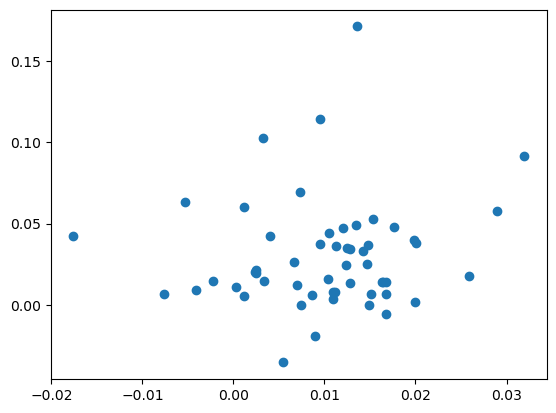

In [14]:
plt.scatter(y_pred, val_y)

In [15]:
pd.Series(y_pred).corr(pd.Series(val_y.values))


0.10718140928196776

## Now we put this gbm magic into a class

In [27]:
def lgb_argsDict_tranform(argsDict):
    argsDict["max_depth"] = argsDict["max_depth"] + 5
    argsDict["num_trees"] = argsDict["num_trees"] + 30
    argsDict["learning_rate"] = argsDict["learning_rate"] * 0.02 + 0.05
    argsDict["bagging_fraction"] = argsDict["bagging_fraction"] * 0.1 + 0.5
    argsDict["num_leaves"] = argsDict["num_leaves"] * 2 + 10
    argsDict["bagging_freq"] = argsDict["num_leaves"] + 10
    argsDict["subsample"] = argsDict["subsample"] * 0.02 + 0.05
    return argsDict

def mape(y_true, y_pred):
    y_true_np, y_pred_np = np.array(y_true), np.array(y_pred)
    pct_change = (y_true_np - y_pred_np) / y_true_np
    mape = pd.Series(pct_change).replace(np.inf, 0).replace(-np.inf, 0).abs().mean()
    return mape


class GBM:
    def __init__(self):
        self.model = None
        self.opt_res = None

    def lgb_get_model_score_mape(self, model):
        prediction = model.predict(self.val_X, num_iteration=model.best_iteration)
        y_predicted = pd.Series(prediction)
        return mape(self.val_y, y_predicted)
        
    def predict(self, X, index=None):
        y_pred = self.model.predict(X, num_iteration=self.model.best_iteration)
        return pd.Series(y_pred, index=X.index if index is None else index)
    
    def first_train(self):
        def lightgbm_factory(argsDict):
            argsDict = lgb_argsDict_tranform(argsDict)
            params = {"nthread": -1,
                      "max_depth": argsDict["max_depth"],
                      "num_trees": argsDict["num_trees"],
                      "eta": argsDict["learning_rate"],
                      "bagging_fraction": argsDict["bagging_fraction"],
                      "num_leaves": argsDict["num_leaves"],
                      "bagging_freq": argsDict["bagging_freq"],
                      "subsample": argsDict["subsample"],
                      "objective": "regression",
                      "feature_fraction": 0.7,
                      "lambda_l1": 0,
                      "lambda_l2": 0,
                      'verbose': -1,
                      "bagging_seed": random_state
                     }
            params["metric"] = ["mape"]
            model_lgb = lgb.train(params=params, train_set=self.train_data, num_boost_round=300,
                                  valid_sets = [self.val_data],
                                  verbose_eval=False,
                                  early_stopping_rounds=100, categorical_feature = ['asset'])
            return self.lgb_get_model_score_mape(model_lgb)

        # Find a best model
        lgb_space = {"max_depth": hp.randint("max_depth", 10),
                     "num_trees": hp.randint("num_trees", 8),
                     "learning_rate": hp.uniform("learning_rate", 0.001, 0.5),
                     "bagging_fraction": hp.randint("bagging_fraction", 5),
                     "num_leaves": hp.randint("num_leaves", 8),
                     "bagging_freq": hp.randint("bagging_freq", 1),
                     "subsample": hp.uniform("subsample", 0.1, 0.5),
                    }
        algo = partial(tpe.suggest, n_startup_jobs = 1)
        lgb_best = fmin(fn = lightgbm_factory, space = lgb_space, algo = algo, max_evals = 20,
                        pass_expr_memo_ctrl = None)
        self.opt_res = lgb_argsDict_tranform(lgb_best)

    def train(self, train_data, val_data, val_X, val_y):
        self.train_data = train_data
        self.val_data = val_data
        self.val_X = val_X
        self.val_y = val_y
        if True or self.opt_res is None: # TODO
            self.first_train()
        self.model = lgb.train(params = self.opt_res, train_set = self.train_data, num_boost_round = 20,
                               verbose_eval=False,
                               valid_sets = [self.train_data, self.val_data], categorical_feature = ['asset'], init_model=self.model)
        
        
class GBMBasedRegressor:
    def __init__(self):
        self.gbm = GBM()
    
    def fit_predict(self, X, y):
        start_day = X.day.min().item()
        current_day = X.day.max().item()
        
        full_X_ = X.to_dataframe(dim_order=['day', 'asset'])
        full_X = full_X_.reset_index('asset')
        train_X = X.sel(day=range(start_day, current_day)).to_dataframe(dim_order=['day', 'asset']).reset_index('asset')
        val_X = X.sel(day=[current_day]).to_dataframe(dim_order=['day', 'asset']).reset_index('asset')
        train_y = y.sel(day=range(start_day, current_day)).transpose('day', 'asset').to_series()
        val_y = y.sel(day=[current_day]).transpose('day', 'asset').to_series()

        train_data = lgb.Dataset(data=train_X, label=train_y, categorical_feature=['asset'], free_raw_data=False)
        val_data = lgb.Dataset(data=val_X, label=val_y, categorical_feature=['asset'], free_raw_data=False)
        
        self.gbm.train(train_data, val_data, val_X, val_y)
        return xr.DataArray.from_series(self.gbm.predict(full_X, index=full_X_.index))
        
    def predict(self, X):
        full_X_ = X.to_dataframe(dim_order=['day', 'asset'])
        full_X = full_X_.reset_index('asset')
        return xr.DataArray.from_series(self.gbm.predict(full_X, index=full_X_.index))
        
class Portfolio:
    def __init__(self):
        self.reg = GBMBasedRegressor()

    def initialize(self, X, y):
        pass

    def train(self, X, y):
        self.reg.fit_predict(X, y)

    def construct(self, X):
        current_day = X.day.max().item()
        if self.reg.gbm.model is None:
            return xr.DataArray(0, dims=['day', 'asset'], coords={'asset': X.asset, 'day': np.array([current_day])})
        
        y = self.reg.predict(X.sel(day=[current_day]))
        y_sgn = y > 0.02
        s = y_sgn.sum(dim='asset').item()
        # print(y_sgn)
        if s < 1e-6:
            return y_sgn
        return y_sgn / s
        

In [10]:
reg = GBMBasedRegressor()
performance, cum_y_df = cross_validation(reg, features, ds.dropna(dim='day'), train_lookback=60, per_eval_lookback=1)

  0%|          | 0/1618 [00:00<?, ?it/s]


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.81trial/s, best loss: 1.4753637689743775]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.81trial/s, best loss: 1.4753637689743775]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/tmp/ipykernel_140139/591366826.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 23.94trial/s, best loss: 1.4753637689743775]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7

 55%|█████████████████████████████████████████████████████████████████████████▏                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 24.55trial/s, best loss: 1.4753637689743775]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/tmp/ipykernel_140139/591366826.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05771300500135064 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Info] Start training from score 0.009864

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05397401391701517 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 20.18trial/s, best loss: 1.5923908142362293]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05397401391701517 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 21.34trial/s, best loss: 1.590099531024721]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05397401391701517 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 21.34trial/s, best loss: 1.590099531024721]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 24.30trial/s, best loss: 1.590099531024721]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05397401391701517 will be ignored. Current value: bagging_fraction=0.6

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 24.30trial/s, best loss: 1.590099531024721]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.76trial/s, best loss: 1.590099531024721]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05397401391701517 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05545813049145065 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05397401391701517 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05545813049145065 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05545813049145065 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05940864820135135 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 25.06trial/s, best loss: 1.5757206336921845]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05940864820135135 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05940864820135135 will be ignored. Current value: bagging_fraction=0.8

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 19.20trial/s, best loss: 1.5757206336921845]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05940864820135135 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.63trial/s, best loss: 1.5289827087010968]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 20.03trial/s, best loss: 1.5289827087010968]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05940864820135135 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 20.03trial/s, best loss: 1.5289827087010968]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05940864820135135 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.67trial/s, best loss: 1.5289827087010968]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05940864820135135 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

 10%|█████████████▍                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 21.03trial/s, best loss: 1.2446292299830175]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▌                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 20.38trial/s, best loss: 1.2446292299830175]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.38trial/s, best loss: 1.2446292299830175]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.77trial/s, best loss: 1.1739161916952323]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.55trial/s, best loss: 1.1739161916952323]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053020280289027506 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 14.71trial/s, best loss: 1.4257221170222931]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                 

/tmp/ipykernel_140139/591366826.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.62trial/s, best loss: 1.4042987619849046]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.62trial/s, best loss: 1.4042987619849046]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/591366826.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbac


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.25trial/s, best loss: 1.4028668861631246]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.16trial/s, best loss: 1.3966444191147172]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/591366826.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbac

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.10trial/s, best loss: 1.3963834512407627]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05545258572894186 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056357250402073115 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05545258572894186 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05545258572894186 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_co

/tmp/ipykernel_140139/591366826.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/mi


 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 21.39trial/s, best loss: 0.8972884076675526]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059881963527986005 will be ignored. Current value: bagging_fraction=0.7

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 21.39trial/s, best loss: 0.8972884076675526]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059881963527986005 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.72trial/s, best loss: 0.8972884076675526]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059881963527986005 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 20.06trial/s, best loss: 0.8972884076675526]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059881963527986005 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 20.06trial/s, best loss: 0.8972884076675526]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059881963527986005 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.94trial/s, best loss: 0.8926999328630308]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059881963527986005 will be ignored. Current value: bagging_fraction=0.7

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.22trial/s, best loss: 0.8350173546569013]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.78trial/s, best loss: 0.8350173546569013]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.00trial/s, best loss: 0.8338898849381203]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.00trial/s, best loss: 0.8338898849381203]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.96trial/s, best loss: 0.8338898849381203]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05445965294439746 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05867030527781554 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05445965294439746 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05445965294439746 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002267 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and


 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 19.46trial/s, best loss: 1.1169158133583303]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05504550691228164 will be ignored. Current value: bagging_fraction=0.8

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 19.46trial/s, best loss: 1.1169158133583303]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 17.84trial/s, best loss: 0.9780825658564829]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05504550691228164 will be ignored. Current value: bagging_fraction=0.8

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 17.84trial/s, best loss: 0.9780825658564829]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05504550691228164 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 21.44trial/s, best loss: 0.8855121911123404]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05504550691228164 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05504550691228164 will be ignored. Current value: bagging_fraction=0.8

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 22.26trial/s, best loss: 0.8855121911123404]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05504550691228164 will be ignored. Current value: bagging_fraction=0.8

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05366599860357441 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05366599860357441 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 23.25trial/s, best loss: 1.536010417516768]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05366599860357441 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▌                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05366599860357441 will be ignored. Current value: bagging_fraction=0.5

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 22.93trial/s, best loss: 1.536010417516768]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05366599860357441 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.35trial/s, best loss: 1.528438390113738]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05366599860357441 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.35trial/s, best loss: 1.528438390113738]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05366599860357441 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0579562873946379 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0579562873946379 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 24.33trial/s, best loss: 1.5477033116055567]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 24.33trial/s, best loss: 1.5477033116055567]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 20.17trial/s, best loss: 1.4728610757078338]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 20.36trial/s, best loss: 1.398277002476868]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 20.36trial/s, best loss: 1.398277002476868]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 17.63trial/s, best loss: 1.3941212514367463]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053110143635071286 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05460797335418346 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053110143635071286 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053110143635071286 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

KeyboardInterrupt: 

In [28]:
portfolio = Portfolio()
stat = bt.cross_validation(portfolio, features, ds.sel(day=slice(0, 300)), lookback_window=60, need_full_lookback=True)

  0%|          | 0/300 [00:00<?, ?it/s]


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.01trial/s, best loss: 0.8047195090806483]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.88trial/s, best loss: 0.8047195090806483]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.14trial/s, best loss: 0.8047195090806483]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.14trial/s, best loss: 0.8047195090806483]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.49trial/s, best loss: 0.7929326394402411]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05815861070412306 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05428651643274572 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading,

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05594387716787125 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████▎                                                                                                                  | 3/20 [00:00<00:00, 26.28trial/s, best loss: 0.745836963352065]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05594387716787125 will be ignored. Current value: bagging_fraction=0.9

 20%|███████████████████████████                                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05594387716787125 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 23.61trial/s, best loss: 0.745222966617809]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05594387716787125 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▊                                                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05594387716787125 will be ignored. Current value: bagging_fraction=0.9

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 23.40trial/s, best loss: 0.745222966617809]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05594387716787125 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 22.03trial/s, best loss: 0.7451972855329007]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05594387716787125 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 22.03trial/s, best loss: 0.7451972855329007]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05646114636025977 will be ignored. Current value: bagging_fraction=0.6

 10%|█████████████▍                                                                                                                        | 2/20 [00:00<00:01, 13.25trial/s, best loss: 0.8563125673387317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05646114636025977 will be ignored. Current value: bagging_fraction=0.6

 10%|█████████████▍                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.39trial/s, best loss: 0.8457297657170186]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05646114636025977 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.39trial/s, best loss: 0.8457297657170186]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.32trial/s, best loss: 0.8165111007815707]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05646114636025977 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.32trial/s, best loss: 0.8165111007815707]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.18trial/s, best loss: 0.8084894627941509]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05646114636025977 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.18trial/s, best loss: 0.8084894627941509]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05646114636025977 will be ignored. Current value: bagging_fraction=0.6

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:01<00:00, 20.72trial/s, best loss: 0.8084894627941509]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05646114636025977 will be ignored. Current value: bagging_fraction=0.6

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 10%|█████████████▍                                                                                                                        | 2/20 [00:00<00:01, 16.79trial/s, best loss: 1.3359786875444015]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 10%|█████████████▍                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 19.61trial/s, best loss: 1.2400565477817993]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 19.61trial/s, best loss: 1.2400565477817993]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 21.37trial/s, best loss: 1.1993938308528915]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▏                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.13trial/s, best loss: 1.1993938308528915]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05659688427907471 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058898738996402245 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05659688427907471 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05659688427907471 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 25.04trial/s, best loss: 1.2722409742699652]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.93trial/s, best loss: 1.2722409742699652]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 23.25trial/s, best loss: 1.2722409742699652]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 23.80trial/s, best loss: 1.2722409742699652]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05905116762683645 will be ignored. Current value: bagging_fraction=0.8

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 17.13trial/s, best loss: 1.6256856441901886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 19.25trial/s, best loss: 1.6045701272960442]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 20.46trial/s, best loss: 1.5852526226337176]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.53trial/s, best loss: 1.5851720238302514]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.53trial/s, best loss: 1.5851720238302514]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053418015561877495 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05856035390000132 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053418015561877495 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053418015561877495 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05271749107384753 will be ignored. Current value: bagging_fraction=0.8

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 24.06trial/s, best loss: 0.9566722258803932]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05271749107384753 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05271749107384753 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.80trial/s, best loss: 0.9161100021994286]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05271749107384753 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05271749107384753 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 22.64trial/s, best loss: 0.9161100021994286]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05271749107384753 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.60trial/s, best loss: 0.9161100021994286]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05271749107384753 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.60trial/s, best loss: 0.9161100021994286]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 17.63trial/s, best loss: 1.5289357175602671]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

 15%|████████████████████                                                                                                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▊                                                                                               | 6/20 [00:00<00:00, 20.34trial/s, best loss: 1.31234198568216]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▊                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 20.37trial/s, best loss: 1.1199182632382074]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.47trial/s, best loss: 1.1199182632382074]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.88trial/s, best loss: 1.1199182632382074]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057265663555928895 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05435557219533549 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9

  5%|██████▊                                                                                                                                | 1/20 [00:00<00:01, 18.00trial/s, best loss: 1.385818019430365]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.02trial/s, best loss: 1.3787559712459856]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.67trial/s, best loss: 1.3776156568592937]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.55trial/s, best loss: 1.3776156568592937]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.55trial/s, best loss: 1.3776156568592937]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.68trial/s, best loss: 1.3776156568592937]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05863817674475466 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05691363139795634 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05863817674475466 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05863817674475466 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and


 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.09trial/s, best loss: 1.1945042648424902]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0562505080524436 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.09trial/s, best loss: 1.1945042648424902]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 24.61trial/s, best loss: 1.1850068617883347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0562505080524436 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 24.61trial/s, best loss: 1.1850068617883347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0562505080524436 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.04trial/s, best loss: 1.1630729802467445]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0562505080524436 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0562505080524436 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.96trial/s, best loss: 1.1630591508616537]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0562505080524436 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05716257991634987 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0562505080524436 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05580883523262058 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 26.95trial/s, best loss: 1.1427667966624635]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05580883523262058 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05580883523262058 will be ignored. Current value: bagging_fraction=0.6

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 26.31trial/s, best loss: 1.1367364643570428]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05580883523262058 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.61trial/s, best loss: 1.1324269101233144]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05580883523262058 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.61trial/s, best loss: 1.1324269101233144]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05580883523262058 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 22.84trial/s, best loss: 1.1306446020991134]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05580883523262058 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.62trial/s, best loss: 1.2135499158653824]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.86trial/s, best loss: 1.2135499158653824]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.81trial/s, best loss: 1.2135499158653824]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.81trial/s, best loss: 1.2135499158653824]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.73trial/s, best loss: 1.2109545402774085]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05775710980537098 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05982977607405438 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05775710980537098 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05775710980537098 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and


 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 23.95trial/s, best loss: 1.2131268851596135]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05315983848003412 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 23.95trial/s, best loss: 1.2131268851596135]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05315983848003412 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 23.29trial/s, best loss: 1.2131268851596135]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05315983848003412 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 21.89trial/s, best loss: 1.2131268851596135]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05315983848003412 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 21.89trial/s, best loss: 1.2131268851596135]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 23.20trial/s, best loss: 1.2131268851596135]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05315983848003412 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 23.20trial/s, best loss: 1.2131268851596135]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05570147626109322 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05570147626109322 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.25trial/s, best loss: 0.7749221923043328]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05570147626109322 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05570147626109322 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.58trial/s, best loss: 0.7637942968023158]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05570147626109322 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.55trial/s, best loss: 0.746638602648421]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05570147626109322 will be ignored. Current value: bagging_fraction=0.8

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.55trial/s, best loss: 0.746638602648421]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05397164970499253 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05570147626109322 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05397164970499253 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05397164970499253 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000251 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.21trial/s, best loss: 1.7317952575673377]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05952229742538553 will be ignored. Current value: bagging_fraction=0.8

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.21trial/s, best loss: 1.7317952575673377]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 25.10trial/s, best loss: 1.404101393359301]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05952229742538553 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 25.10trial/s, best loss: 1.404101393359301]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05952229742538553 will be ignored. Current value: bagging_fraction=0.8

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 25.17trial/s, best loss: 1.404101393359301]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05952229742538553 will be ignored. Current value: bagging_fraction=0.8

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 25.17trial/s, best loss: 1.404101393359301]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05952229742538553 will be ignored. Current value: bagging_fraction=0.8

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 24.84trial/s, best loss: 1.404101393359301]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05952229742538553 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05573077454104501 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05952229742538553 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05573077454104501 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05573077454104501 will be ignored. Current value: bagging_fraction=

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qi


 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.89trial/s, best loss: 1.4497740388550424]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.89trial/s, best loss: 1.4497740388550424]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 24.64trial/s, best loss: 1.3534149283369874]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 25.06trial/s, best loss: 1.3534149283369874]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 25.36trial/s, best loss: 1.3534149283369874]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 24.98trial/s, best loss: 1.3391437622223594]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.058614794080457416 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923762757936423 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056236949700639215 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████▎                                                                                                                  | 3/20 [00:00<00:00, 27.71trial/s, best loss: 1.493674263295028]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056236949700639215 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████▎                                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056236949700639215 will be ignored. Current value: bagging_fraction=0.5

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 24.39trial/s, best loss: 1.4791873953150514]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056236949700639215 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                        

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.25trial/s, best loss: 1.4161830283773875]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056236949700639215 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 25.25trial/s, best loss: 1.4161830283773875]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 25.68trial/s, best loss: 1.4161434007119527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056236949700639215 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 25.68trial/s, best loss: 1.4161434007119527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8

  5%|██████▊                                                                                                                                 | 1/20 [00:00<00:01, 16.83trial/s, best loss: 1.32061442764408]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8

 15%|████████████████████▎                                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecate


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.60trial/s, best loss: 1.2740543108436653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.60trial/s, best loss: 1.2740543108436653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.60trial/s, best loss: 1.2740543108436653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 24.63trial/s, best loss: 1.2740543108436653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05328087888749336 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057411363381381614 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05328087888749336 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05328087888749336 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.008622 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

  0%|                                                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.32trial/s, best loss: 1.1646605020771221]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053345435621228204 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.32trial/s, best loss: 1.1646605020771221]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053345435621228204 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 24.50trial/s, best loss: 1.157839372976886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053345435621228204 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053345435621228204 will be ignored. Current value: bagging_fraction=0.5

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 23.09trial/s, best loss: 1.157839372976886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053345435621228204 will be ignored. Current value: bagging_fraction=0.5

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053345435621228204 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057904301849990306 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053345435621228204 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057904301849990306 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057904301849990306 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000302 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 25.20trial/s, best loss: 1.5051672428908975]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05540630388861214 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 25.20trial/s, best loss: 1.5051672428908975]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05540630388861214 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 24.16trial/s, best loss: 1.5035324315167973]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05540630388861214 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05540630388861214 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 25.36trial/s, best loss: 1.5035324315167973]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05540630388861214 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056284347347744734 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.36trial/s, best loss: 1.6253984893665228]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056284347347744734 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.36trial/s, best loss: 1.6253984893665228]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 26.58trial/s, best loss: 1.6063606481595767]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056284347347744734 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 26.58trial/s, best loss: 1.6063606481595767]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 25.83trial/s, best loss: 1.6017449017211154]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056284347347744734 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 25.83trial/s, best loss: 1.6017449017211154]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05753462030771976 will be ignored. Current value: bagging_fraction=0.8

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:00, 22.08trial/s, best loss: 1.6267828380605869]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05753462030771976 will be ignored. Current value: bagging_fraction=0.8

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.79trial/s, best loss: 1.5802222315432441]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05753462030771976 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.79trial/s, best loss: 1.5802222315432441]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 26.03trial/s, best loss: 1.5022592116212166]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05753462030771976 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 26.03trial/s, best loss: 1.5022592116212166]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05753462030771976 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 24.95trial/s, best loss: 1.5022592116212166]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05753462030771976 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05994073224683107 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05994073224683107 will be ignored. Current value: bagging_fraction=0.9

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 28.86trial/s, best loss: 1.2200985311752708]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05994073224683107 will be ignored. Current value: bagging_fraction=0.9

 35%|██████████████████████████████████████████████▉                                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05994073224683107 will be ignored. Current value: bagging_fraction=0.9

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 27.23trial/s, best loss: 1.178006128110672]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05994073224683107 will be ignored. Current value: bagging_fraction=0.9

 65%|███████████████████████████████████████████████████████████████████████████████████████                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05994073224683107 will be ignored. Current value: bagging_fraction=0.9

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 26.66trial/s, best loss: 1.1773731944782477]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05994073224683107 will be ignored. Current value: bagging_fraction=0.9

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05898090360932004 will be ignored. Current value: bagging_fraction=0.6

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:00, 20.10trial/s, best loss: 1.4149250617084688]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05898090360932004 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05898090360932004 will be ignored. Current value: bagging_fraction=0.6

 35%|███████████████████████████████████████████████▎                                                                                       | 7/20 [00:00<00:00, 26.62trial/s, best loss: 1.408819797434846]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05898090360932004 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05898090360932004 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.52trial/s, best loss: 1.4030778680984286]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05898090360932004 will be ignored. Current value: bagging_fraction=0.6

 60%|████████████████████████████████████████████████████████████████████████████████▍                                      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 21.95trial/s, best loss: 1.400030834305702]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05898090360932004 will be ignored. Current value: bagging_fraction=0.6

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 21.95trial/s, best loss: 1.400030834305702]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058039980140394895 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000795 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

  0%|                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.32trial/s, best loss: 0.9039825920979331]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056065769959220954 will be ignored. Current value: bagging_fraction=0.7

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 25.32trial/s, best loss: 0.9039825920979331]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 25.24trial/s, best loss: 0.9039825920979331]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056065769959220954 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 25.24trial/s, best loss: 0.9039825920979331]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056065769959220954 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.28trial/s, best loss: 0.8859343451179709]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056065769959220954 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056065769959220954 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 23.84trial/s, best loss: 0.8859343451179709]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056065769959220954 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05217177394468786 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056065769959220954 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsamp

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056502272026611344 will be ignored. Current value: bagging_fraction=0.9

  5%|██████▊                                                                                                                                | 1/20 [00:00<00:01, 16.78trial/s, best loss: 0.838013000085554]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056502272026611344 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████                                                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 23.28trial/s, best loss: 0.835145407109736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056502272026611344 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 23.28trial/s, best loss: 0.835145407109736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 26.15trial/s, best loss: 0.8338060955606449]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056502272026611344 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 26.15trial/s, best loss: 0.8338060955606449]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 28.20trial/s, best loss: 0.8338008075787323]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056502272026611344 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 26.31trial/s, best loss: 0.8338008075787323]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056502272026611344 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05958365302932615 will be ignored. Current value: bagging_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057683070467332655 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057683070467332655 will be ignored. Current value: bagging_fraction=0.6

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:00, 21.69trial/s, best loss: 1.7657144489058052]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecate


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.17trial/s, best loss: 1.0601788928787106]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057683070467332655 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.17trial/s, best loss: 1.0601788928787106]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057683070467332655 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.48trial/s, best loss: 0.9677937745153303]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057683070467332655 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057683070467332655 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 23.62trial/s, best loss: 0.9204486097217456]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057683070467332655 will be ignored. Current value: bagging_fraction=0.6

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05462166563156924 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 25.85trial/s, best loss: 1.561869963745197]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05462166563156924 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 25.85trial/s, best loss: 1.561869963745197]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.59trial/s, best loss: 1.5243323474468242]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05462166563156924 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.59trial/s, best loss: 1.5243323474468242]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05462166563156924 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 23.72trial/s, best loss: 1.5241494229378947]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05462166563156924 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.30trial/s, best loss: 1.4503785612064253]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.10trial/s, best loss: 1.4503785612064253]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 24.60trial/s, best loss: 1.4313795763514159]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05738061719494659 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058111673412577954 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05738061719494659 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05738061719494659 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05716840386448787 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:02,  8.26trial/s, best loss: 1.4770619514678407]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05716840386448787 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05716840386448787 will be ignored. Current value: bagging_fraction=0.5

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 13.38trial/s, best loss: 1.4770619514678407]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05716840386448787 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 19.25trial/s, best loss: 1.4770619514678407]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05716840386448787 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 19.25trial/s, best loss: 1.4770619514678407]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 22.47trial/s, best loss: 1.4770619514678407]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05716840386448787 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 22.47trial/s, best loss: 1.4770619514678407]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05385776329318413 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 25.91trial/s, best loss: 1.2396704522872517]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05385776329318413 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 25.91trial/s, best loss: 1.2396704522872517]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05385776329318413 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 24.93trial/s, best loss: 1.2396704522872517]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05385776329318413 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05385776329318413 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 25.40trial/s, best loss: 1.2396704522872517]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05385776329318413 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05526603477556943 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 25.45trial/s, best loss: 0.9865529287099548]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05526603477556943 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 25.45trial/s, best loss: 0.9865529287099548]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05526603477556943 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 24.43trial/s, best loss: 0.9703439958821557]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05526603477556943 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05526603477556943 will be ignored. Current value: bagging_fraction=0.7

 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 18/20 [00:00<00:00, 24.14trial/s, best loss: 0.9696467157903]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05526603477556943 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05526603477556943 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05446216887095806 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05446216887095806 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 22.56trial/s, best loss: 0.7391078873043605]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05919247340959353 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 22.56trial/s, best loss: 0.7391078873043605]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05919247340959353 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 24.41trial/s, best loss: 0.7188675229975071]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05919247340959353 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 24.41trial/s, best loss: 0.7188675229975071]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05919247340959353 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 27.98trial/s, best loss: 0.7188675229975071]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05919247340959353 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 30.75trial/s, best loss: 1.5396281282361122]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 24.25trial/s, best loss: 1.4379161140212904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 24.25trial/s, best loss: 1.4379161140212904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [00:00<00:00, 23.61trial/s, best loss: 1.409937691649105]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.90trial/s, best loss: 1.4093300527866206]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059192725586609776 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056324541607384884 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059192725586609776 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059192725586609776 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `forc

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 24.25trial/s, best loss: 0.8458711299626945]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 24.40trial/s, best loss: 0.7601440456826545]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 25.60trial/s, best loss: 0.7601440456826545]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 25.75trial/s, best loss: 0.7540078413907935]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05474236418315763 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05303809892694296 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:00, 20.30trial/s, best loss: 1.2506390888838108]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 27.23trial/s, best loss: 1.2366636216556472]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.59trial/s, best loss: 1.2366636216556472]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 24.72trial/s, best loss: 1.2366636216556472]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05791890663946976 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053629650429669495 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053629650429669495 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 30.08trial/s, best loss: 0.6790603347429964]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053629650429669495 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053629650429669495 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 27.79trial/s, best loss: 0.6790603347429964]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053629650429669495 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053629650429669495 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 27.14trial/s, best loss: 0.6790603347429964]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053629650429669495 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0572578667441845 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 27.51trial/s, best loss: 0.9813296498345188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0572578667441845 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 27.51trial/s, best loss: 0.9813296498345188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0572578667441845 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 27.38trial/s, best loss: 0.9758129179871424]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0572578667441845 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                  

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0572578667441845 will be ignored. Current value: bagging_fraction=0.9

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 26.75trial/s, best loss: 0.9758129179871424]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0572578667441845 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057727603431124354 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.31trial/s, best loss: 1.1180066571413358]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057727603431124354 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.31trial/s, best loss: 1.1180066571413358]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.89trial/s, best loss: 1.1180066571413358]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057727603431124354 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.89trial/s, best loss: 1.1180066571413358]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 26.52trial/s, best loss: 1.1154577122598812]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057727603431124354 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 26.52trial/s, best loss: 1.1154577122598812]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05847829822409988 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.08trial/s, best loss: 0.9540825423830527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05847829822409988 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.08trial/s, best loss: 0.9540825423830527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.44trial/s, best loss: 0.9540825423830527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05847829822409988 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.44trial/s, best loss: 0.9540825423830527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05847829822409988 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 21.20trial/s, best loss: 0.9540825423830527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05847829822409988 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05847829822409988 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 22.84trial/s, best loss: 0.9540825423830527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05847829822409988 will be ignored. Current value: bagging_fraction=0.5

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.84trial/s, best loss: 0.9086123132135201]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 22.40trial/s, best loss: 0.885962285753907]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.53trial/s, best loss: 0.8691590440796778]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.53trial/s, best loss: 0.8691590440796778]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.04trial/s, best loss: 0.8544825627211522]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05426507788278678 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05510624864939531 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05426507788278678 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05426507788278678 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000295 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:00, 20.35trial/s, best loss: 0.7774324754115804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.65trial/s, best loss: 0.7553968283775369]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.65trial/s, best loss: 0.7553968283775369]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.54trial/s, best loss: 0.7553968283775369]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 23.85trial/s, best loss: 0.753571042704877]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054290419275158784 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05266998968858634 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054290419275158784 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054290419275158784 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits w

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058310001652654014 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 24.83trial/s, best loss: 1.0659028131209243]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058310001652654014 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████                                                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058310001652654014 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 25.18trial/s, best loss: 1.0095073759763773]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058310001652654014 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058310001652654014 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 24.74trial/s, best loss: 1.0095073759763773]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058310001652654014 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 23.12trial/s, best loss: 1.0095073759763773]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058310001652654014 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 23.12trial/s, best loss: 1.0095073759763773]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.34trial/s, best loss: 1.4571567908048535]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 24.59trial/s, best loss: 1.4571567908048535]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 24.96trial/s, best loss: 1.4571567908048535]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 24.16trial/s, best loss: 1.4061215500088962]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05690449204724045 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053653330592612396 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05690449204724045 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05690449204724045 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_co

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 22.41trial/s, best loss: 1.298618714708338]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.47trial/s, best loss: 1.1778571787392897]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 24.72trial/s, best loss: 1.1529334858527152]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 24.72trial/s, best loss: 1.1529334858527152]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05325465288347586 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05634044907627294 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05634044907627294 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05349984607281705 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████▎                                                                                                                  | 3/20 [00:00<00:00, 27.97trial/s, best loss: 1.135668798486915]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05349984607281705 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████▎                                                                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 27.47trial/s, best loss: 1.1141473190203355]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05349984607281705 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 24.82trial/s, best loss: 1.090394930258422]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 23.22trial/s, best loss: 1.090394930258422]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05349984607281705 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 23.22trial/s, best loss: 1.090394930258422]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05349984607281705 will be ignored. Current value: bagging_fraction=0.5

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 23.07trial/s, best loss: 1.090394930258422]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05349984607281705 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05986704586714587 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7

  0%|                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.31trial/s, best loss: 1.6644843271137288]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.87trial/s, best loss: 1.6644843271137288]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7

 60%|████████████████████████████████████████████████████████████████████████████████▍                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.29trial/s, best loss: 1.597138879902918]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.29trial/s, best loss: 1.597138879902918]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0522744756216364 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0571381309951744 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0522744756216364 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0522744756216364 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 20.61trial/s, best loss: 1.6216611404268053]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 21.57trial/s, best loss: 1.5602249477468035]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.08trial/s, best loss: 1.5267791153325059]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.08trial/s, best loss: 1.5267791153325059]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 23.17trial/s, best loss: 1.5267791153325059]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576596841071144 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05788845590500368 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05788845590500368 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054904419526878925 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.29trial/s, best loss: 2.0089848057219166]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054904419526878925 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054904419526878925 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 24.02trial/s, best loss: 2.0089848057219166]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054904419526878925 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.23trial/s, best loss: 1.8735069200612349]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054904419526878925 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.23trial/s, best loss: 1.8735069200612349]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.04trial/s, best loss: 1.8735069200612349]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054904419526878925 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342655779645137 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054904419526878925 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342655779645137 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342655779645137 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_co

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.48trial/s, best loss: 1.2188514744180696]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.71trial/s, best loss: 1.2053509771100281]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 23.36trial/s, best loss: 1.205127807658835]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 23.36trial/s, best loss: 1.205127807658835]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.95trial/s, best loss: 1.1958819487576975]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058771114505623424 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059039036581297236 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058771114505623424 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058771114505623424 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.43trial/s, best loss: 1.2427601109111182]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.20trial/s, best loss: 1.2427601109111182]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.39trial/s, best loss: 1.1774256906337657]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.99trial/s, best loss: 1.1774256906337657]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05566816189153337 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997667479229115 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.93trial/s, best loss: 1.2297096893189126]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.08trial/s, best loss: 1.1993748461429252]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.38trial/s, best loss: 1.1993748461429252]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.38trial/s, best loss: 1.1993748461429252]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 17.98trial/s, best loss: 1.1993748461429252]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0542281582537414 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059976462545589256 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059976462545589256 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000359 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:00, 19.37trial/s, best loss: 1.4547527443090293]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████                                                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.05trial/s, best loss: 1.4336960872100757]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.05trial/s, best loss: 1.4336960872100757]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 20.96trial/s, best loss: 1.4312656487650373]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.65trial/s, best loss: 1.4312656487650373]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.65trial/s, best loss: 1.4296724768399949]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05571688045676468 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058081309274334296 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05571688045676468 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05571688045676468 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000409 seconds.
You can set `force_co

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.96trial/s, best loss: 1.6305478918363865]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.40trial/s, best loss: 1.6305478918363865]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.62trial/s, best loss: 1.6293578541348703]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.62trial/s, best loss: 1.6293578541348703]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.59trial/s, best loss: 1.6293578541348703]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 22.27trial/s, best loss: 1.6293578541348703]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056575931390430836 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.65trial/s, best loss: 1.2666602219379965]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 24.17trial/s, best loss: 1.2601547471019034]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 26.15trial/s, best loss: 1.2581062405003665]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0551597501562761 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053629733453678025 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0551597501562761 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0551597501562761 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 24.52trial/s, best loss: 1.0757947999002315]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 18.50trial/s, best loss: 1.0210142668184221]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 18.50trial/s, best loss: 1.0210142668184221]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 18.62trial/s, best loss: 1.0065168987443356]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 18.62trial/s, best loss: 1.0065168987443356]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 21.86trial/s, best loss: 1.0065168987443356]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.82trial/s, best loss: 1.0065168987443356]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569552527060994 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059061782755355466 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569552527060994 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569552527060994 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_co

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.85trial/s, best loss: 0.8794295704201744]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.49trial/s, best loss: 0.8794295704201744]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 24.16trial/s, best loss: 0.8794295704201744]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054324015732177405 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:00, 29.39trial/s, best loss: 1.8166238857228376]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 27.09trial/s, best loss: 1.8108684724283657]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.25trial/s, best loss: 1.8107953574900246]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 21.80trial/s, best loss: 1.787790221784294]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05212820693827372 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05365170755805505 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05212820693827372 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05212820693827372 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 15.63trial/s, best loss: 1.1000593583981604]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████▍                                                                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.39trial/s, best loss: 1.0980114869387418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.39trial/s, best loss: 1.0980114869387418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.54trial/s, best loss: 1.0980114869387418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.54trial/s, best loss: 1.0980114869387418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.22trial/s, best loss: 1.0980114869387418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05992233913184403 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05573647201612815 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05992233913184403 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05992233913184403 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 16.58trial/s, best loss: 0.9343480202433815]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.22trial/s, best loss: 0.9343480202433815]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.22trial/s, best loss: 0.9343480202433815]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 21.30trial/s, best loss: 0.9343480202433815]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 21.78trial/s, best loss: 0.9343480202433815]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05908923744931731 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

  5%|██████▊                                                                                                                                | 1/20 [00:00<00:00, 22.61trial/s, best loss: 1.014543929105191]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████▎                                                                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▊                                                                                               | 6/20 [00:00<00:00, 23.48trial/s, best loss: 1.00867367831485]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▊                                                                                               | 6/20 [00:00<00:00, 23.48trial/s, best loss: 1.00867367831485]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.15trial/s, best loss: 0.9735919335569243]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 14.32trial/s, best loss: 0.9735919335569243]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.47trial/s, best loss: 0.9462330254847756]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0586732957900694 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05452111689250352 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.74trial/s, best loss: 0.9182761141740527]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.25trial/s, best loss: 0.8958688125886479]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 21.42trial/s, best loss: 0.882318148537829]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.01trial/s, best loss: 0.882318148537829]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.057898820498506795 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05310131223841229 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 22.39trial/s, best loss: 1.109687291692553]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▌                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.76trial/s, best loss: 1.0485036677996822]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.99trial/s, best loss: 1.0485036677996822]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.80trial/s, best loss: 1.0485036677996822]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05389547016932829 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05647400846984099 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05389547016932829 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05389547016932829 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 17.06trial/s, best loss: 0.8858961842783315]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 25.58trial/s, best loss: 0.8249660458862758]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 22.64trial/s, best loss: 0.8133446378470154]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 22.50trial/s, best loss: 0.8133446378470154]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05759845691155721 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05555545496417995 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05759845691155721 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05759845691155721 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

  0%|                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5

  5%|██████▊                                                                                                                                | 1/20 [00:00<00:00, 19.49trial/s, best loss: 1.477993125202626]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████▎                                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecate


 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 23.97trial/s, best loss: 1.354160420696712]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 23.97trial/s, best loss: 1.354160420696712]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 22.63trial/s, best loss: 1.354160420696712]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.43trial/s, best loss: 1.354160420696712]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057614443160275676 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056909759033923674 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057614443160275676 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057614443160275676 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.36trial/s, best loss: 2.5090400394036667]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 23.16trial/s, best loss: 2.324989011303851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7

 60%|████████████████████████████████████████████████████████████████████████████████▍                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.35trial/s, best loss: 2.324989011303851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.35trial/s, best loss: 2.324989011303851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.82trial/s, best loss: 1.8566745122127661]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05823267336834827 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055315814785154196 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05823267336834827 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05823267336834827 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_co

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.65trial/s, best loss: 0.9349654522006374]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.71trial/s, best loss: 0.9349654522006374]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.46trial/s, best loss: 0.9349654522006374]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.46trial/s, best loss: 0.9349654522006374]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05212523307815839 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05632370262000201 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05212523307815839 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05212523307815839 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053296609906490544 will be ignored. Current value: bagging_fraction=0.9

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 15.68trial/s, best loss: 0.9934969976186596]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053296609906490544 will be ignored. Current value: bagging_fraction=0.9

 15%|████████████████████▎                                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.55trial/s, best loss: 0.9586091468163601]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053296609906490544 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.55trial/s, best loss: 0.9586091468163601]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053296609906490544 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 22.41trial/s, best loss: 0.9566854098667537]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053296609906490544 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.33trial/s, best loss: 0.9503643474683103]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053296609906490544 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.33trial/s, best loss: 0.9503643474683103]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053296609906490544 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05564715892756846 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05564715892756846 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:01, 15.61trial/s, best loss: 1.0444310932578436]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6

 15%|████████████████████                                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.66trial/s, best loss: 1.0378267557933678]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.66trial/s, best loss: 1.0378267557933678]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.52trial/s, best loss: 1.0356290537177477]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 24.53trial/s, best loss: 1.0352740795800537]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05583231752775175 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05638090013565619 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05638090013565619 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 22.76trial/s, best loss: 0.9930256549964972]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059888853277629946 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 22.76trial/s, best loss: 0.9930256549964972]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059888853277629946 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 24.09trial/s, best loss: 0.988145809291265]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059888853277629946 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▋                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059888853277629946 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.98trial/s, best loss: 0.9750148440471462]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059888853277629946 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 23.30trial/s, best loss: 0.9750148440471462]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059888853277629946 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05521899901733264 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059888853277629946 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05521899901733264 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05521899901733264 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_co

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.91trial/s, best loss: 1.3534602977154653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.64trial/s, best loss: 1.3534602977154653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.64trial/s, best loss: 1.3534602977154653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.73trial/s, best loss: 1.3534602977154653]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.18trial/s, best loss: 1.3534602977154653]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05338271911915597 will be ignored. Current value: bagging_fraction=

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.21trial/s, best loss: 1.1221574683579556]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.60trial/s, best loss: 1.1221574683579556]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.29trial/s, best loss: 1.1155676998201207]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.68trial/s, best loss: 1.1148370791392948]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058806213339995916 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05955264472211129 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.33trial/s, best loss: 0.8645979992981226]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.43trial/s, best loss: 0.8366458069276704]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.41trial/s, best loss: 0.8366458069276704]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.41trial/s, best loss: 0.8366458069276704]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.64trial/s, best loss: 0.809531752987504]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05451111685359309 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05317931711290598 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05451111685359309 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05451111685359309 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.71trial/s, best loss: 0.7146323644013629]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.25trial/s, best loss: 0.7127617115788705]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.00trial/s, best loss: 0.6499520418850975]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.23trial/s, best loss: 0.6499520418850975]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05495984509465011 will be ignored. Current value: bagging_fraction=0.9

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

  0%|    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.95trial/s, best loss: 0.7433259703444229]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.39trial/s, best loss: 0.7353608959758013]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.39trial/s, best loss: 0.7353608959758013]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.85trial/s, best loss: 0.7353608959758013]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.39trial/s, best loss: 0.7247172546770675]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.80trial/s, best loss: 0.7247172546770675]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05568619768190079 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.80trial/s, best loss: 0.7247172546770675]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 25.35trial/s, best loss: 0.9867556425772805]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.19trial/s, best loss: 0.9867556425772805]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 24.30trial/s, best loss: 0.9867556425772805]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056288380689898124 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05991366555847204 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05991366555847204 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000468 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.56trial/s, best loss: 0.9492279030867405]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.81trial/s, best loss: 0.9492279030867405]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.24trial/s, best loss: 0.9488309154072864]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.24trial/s, best loss: 0.9488309154072864]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05998296064578325 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05444321882253699 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05998296064578325 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05998296064578325 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.42trial/s, best loss: 1.0245887771327185]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.40trial/s, best loss: 0.9975700617017333]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 23.96trial/s, best loss: 0.965639367131731]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 23.41trial/s, best loss: 0.965639367131731]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05576695082484788 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05964033700935642 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05576695082484788 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05576695082484788 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 23.65trial/s, best loss: 1.134468876857256]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 23.59trial/s, best loss: 1.134015318691507]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7

 60%|████████████████████████████████████████████████████████████████████████████████▍                                      

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 25.32trial/s, best loss: 1.134015318691507]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.52trial/s, best loss: 1.134015318691507]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05506103309708831 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874435459264743 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05506103309708831 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05506103309708831 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.59trial/s, best loss: 1.0215005965386437]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.03trial/s, best loss: 1.0215005965386437]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 24.54trial/s, best loss: 1.0215005965386437]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05794719139352966 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05211446042053325 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05211446042053325 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.90trial/s, best loss: 0.9954078611269376]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 24.14trial/s, best loss: 0.9954078611269376]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 24.13trial/s, best loss: 0.9792245657631055]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05758464024372428 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056035142321504666 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056035142321504666 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▊                                                                                               | 6/20 [00:00<00:00, 24.02trial/s, best loss: 1.05071908318953]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▊                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8

 60%|█████████████████████████████████████████████████████████████████████████████████                                                      | 12/20 [00:00<00:00, 22.71trial/s, best loss: 1.05071908318953]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8

 60%|█████████████████████████████████████████████████████████████████████████████████                                      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 16/20 [00:00<00:00, 23.91trial/s, best loss: 1.05071908318953]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05543282562354685 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05918496277161247 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05918496277161247 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.09trial/s, best loss: 1.0009409515745622]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 25.75trial/s, best loss: 0.9883315680897465]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 25.19trial/s, best loss: 0.9883315680897465]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 25.28trial/s, best loss: 0.9883315680897465]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05905556882590641 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05347406780181849 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05347406780181849 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.62trial/s, best loss: 1.0108396756007763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.68trial/s, best loss: 0.9854188813988578]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.80trial/s, best loss: 0.9502130608298834]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05779557419036505 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053204143310742226 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05779557419036505 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05779557419036505 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.05trial/s, best loss: 0.9711435749030846]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 23.61trial/s, best loss: 0.9672888141656519]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 23.11trial/s, best loss: 0.9672888141656519]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0586307280419791 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05381069726938422 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0586307280419791 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0586307280419791 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.79trial/s, best loss: 1.0447299685722227]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.50trial/s, best loss: 1.0447299685722227]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.79trial/s, best loss: 1.0447299685722227]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 23.11trial/s, best loss: 1.044284283892046]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05461023376963977 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05492619716778989 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05461023376963977 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05461023376963977 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.63trial/s, best loss: 0.9984498228018304]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 24.60trial/s, best loss: 0.9909105895888126]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.70trial/s, best loss: 0.9909105895888126]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.70trial/s, best loss: 0.9909105895888126]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05477581815844072 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05762739461410753 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05477581815844072 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05477581815844072 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000262 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:00<00:00, 22.07trial/s, best loss: 1.035631601211121]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:00<00:00, 22.07trial/s, best loss: 1.035631601211121]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 23.39trial/s, best loss: 0.9819136804909633]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7

 55%|█████████████████████████████████████████████████████████████████████████▏                                             

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.79trial/s, best loss: 0.9819136804909633]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.88trial/s, best loss: 0.9819136804909633]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054272769763028854 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05691227293277276 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054272769763028854 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054272769763028854 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.25trial/s, best loss: 0.9765436629188415]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.50trial/s, best loss: 0.9492618361580634]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 25.01trial/s, best loss: 0.9439002321555506]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055014328490902875 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055345762247698736 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055345762247698736 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 30.69trial/s, best loss: 0.7835948571103187]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 24.25trial/s, best loss: 0.7719579217036753]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 24.25trial/s, best loss: 0.7719579217036753]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 24.11trial/s, best loss: 0.7719579217036753]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057067020189722345 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054895161438457844 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057067020189722345 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057067020189722345 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 24.96trial/s, best loss: 0.9824268226437093]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.86trial/s, best loss: 0.9490408212225602]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.21trial/s, best loss: 0.9490408212225602]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.21trial/s, best loss: 0.9490408212225602]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 23.37trial/s, best loss: 0.9490408212225602]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055332324856344914 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05727835013548913 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055332324856344914 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055332324856344914 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000290 seconds.
You can set `force_c

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.93trial/s, best loss: 0.8950258769423086]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.63trial/s, best loss: 0.8950258769423086]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.63trial/s, best loss: 0.8950258769423086]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.62trial/s, best loss: 0.8950258769423086]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                     

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 21.62trial/s, best loss: 0.8950258769423086]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.83trial/s, best loss: 0.8829444301533158]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05352933098884211 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0572248976769726 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05352933098884211 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05352933098884211 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_w

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 22.04trial/s, best loss: 0.9359752336428968]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 22.04trial/s, best loss: 0.9359752336428968]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 22.51trial/s, best loss: 0.9359752336428968]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7

 55%|█████████████████████████████████████████████████████████████████████████▏                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.95trial/s, best loss: 0.9359752336428968]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.77trial/s, best loss: 0.9359752336428968]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05983442215826734 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05891066525996942 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05983442215826734 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05983442215826734 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 23.19trial/s, best loss: 1.171617723911893]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▌                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 23.74trial/s, best loss: 1.171617723911893]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6

 60%|████████████████████████████████████████████████████████████████████████████████▍                                      

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.43trial/s, best loss: 1.0972950655532974]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.43trial/s, best loss: 1.0972950655532974]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.43trial/s, best loss: 1.073036416557972]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05352092976915294 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608079657925885 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05352092976915294 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05352092976915294 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05398290850582976 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.58trial/s, best loss: 1.0522684726990885]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05398290850582976 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 26.58trial/s, best loss: 1.0522684726990885]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05398290850582976 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 22.59trial/s, best loss: 1.0522684726990885]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05398290850582976 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.16trial/s, best loss: 1.0522684726990885]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05398290850582976 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.16trial/s, best loss: 1.0522684726990885]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.36trial/s, best loss: 1.0214394150427928]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05398290850582976 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057153929968000144 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05398290850582976 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057153929968000144 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057153929968000144 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_c

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053757926793790926 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 24.02trial/s, best loss: 0.952107965478187]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053757926793790926 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▌                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053757926793790926 will be ignored. Current value: bagging_fraction=0.8

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 22.78trial/s, best loss: 0.952107965478187]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053757926793790926 will be ignored. Current value: bagging_fraction=0.8

 60%|████████████████████████████████████████████████████████████████████████████████▍                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.07trial/s, best loss: 0.952107965478187]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053757926793790926 will be ignored. Current value: bagging_fraction=0.8

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.07trial/s, best loss: 0.952107965478187]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.82trial/s, best loss: 0.952107965478187]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053757926793790926 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05900737650421889 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053757926793790926 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05900737650421889 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05900737650421889 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000903 seconds.
You can set `force_co

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.65trial/s, best loss: 0.9164316833864864]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.28trial/s, best loss: 0.9103892446350831]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.51trial/s, best loss: 0.9034042935514556]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.51trial/s, best loss: 0.9034042935514556]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.46trial/s, best loss: 0.891097143744156]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707463518284701 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0552236862029661 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707463518284701 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707463518284701 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wi

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.41trial/s, best loss: 0.9986240298557418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 18.51trial/s, best loss: 0.9670290535771828]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 18.99trial/s, best loss: 0.9560807001923005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 18.99trial/s, best loss: 0.9560807001923005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.85trial/s, best loss: 0.9496454047099298]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                        

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.92trial/s, best loss: 0.9496454047099298]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054908844989167586 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056316144880518004 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.056316144880518004 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057414956288322425 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.55trial/s, best loss: 0.9370794222657514]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057414956288322425 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.55trial/s, best loss: 0.9370794222657514]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.58trial/s, best loss: 0.9205724530415151]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057414956288322425 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.58trial/s, best loss: 0.9205724530415151]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057414956288322425 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.88trial/s, best loss: 0.9068735049006323]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057414956288322425 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.58trial/s, best loss: 0.9064737165715085]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057414956288322425 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.58trial/s, best loss: 0.9064737165715085]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057414956288322425 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05664643975756262 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05664643975756262 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.47trial/s, best loss: 0.9694718411657822]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.30trial/s, best loss: 0.9694718411657822]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 23.60trial/s, best loss: 0.9654874427817013]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.054367085267054305 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05626035350349784 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.054367085267054305 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.054367085267054305 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits w

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.48trial/s, best loss: 0.8480690377056874]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.19trial/s, best loss: 0.8480690377056874]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.70trial/s, best loss: 0.8480690377056874]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.50trial/s, best loss: 0.8464207548256993]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.71trial/s, best loss: 0.8464207548256993]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: baggin

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059250569571913464 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05201801648515657 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05201801648515657 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 19.50trial/s, best loss: 0.8614764554073919]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.55trial/s, best loss: 0.8614764554073919]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.42trial/s, best loss: 0.8614764554073919]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.55trial/s, best loss: 0.8577275789513698]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.55trial/s, best loss: 0.8577275789513698]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057831412774636846 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059148583505137166 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059148583505137166 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 22.25trial/s, best loss: 1.187364869729619]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.87trial/s, best loss: 1.1416097017960811]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.22trial/s, best loss: 1.1416097017960811]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.22trial/s, best loss: 1.1416097017960811]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.07trial/s, best loss: 1.1278662438652158]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.73trial/s, best loss: 1.1278662438652158]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053934901083391544 will be ignored. Current value: bagging_fraction=0.5


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052944928376227864 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053934901083391544 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053934901083391544 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 22.26trial/s, best loss: 1.121816833930839]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 22.40trial/s, best loss: 1.121816833930839]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

 60%|████████████████████████████████████████████████████████████████████████████████▍                                      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 20.18trial/s, best loss: 1.121816833930839]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 18.52trial/s, best loss: 1.121816833930839]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 18.52trial/s, best loss: 1.121816833930839]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05612358047997677 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05596332214189412 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05596332214189412 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0592512855123393 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0592512855123393 will be ignored. Current value: bagging_fraction=0.8

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 20.49trial/s, best loss: 1.569871497169321]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0592512855123393 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 21.16trial/s, best loss: 1.569871497169321]
                                                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.51trial/s, best loss: 1.5236733892468834]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0592512855123393 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.51trial/s, best loss: 1.5236733892468834]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 18.83trial/s, best loss: 1.523374281402498]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0592512855123393 will be ignored. Current value: bagging_fraction=0.8

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 18.83trial/s, best loss: 1.523374281402498]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.26trial/s, best loss: 1.5168162618539611]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0592512855123393 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.26trial/s, best loss: 1.5168162618539611]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsa

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0592512855123393 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05845180135774035 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05845180135774035 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 22.22trial/s, best loss: 1.1399924935581542]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.66trial/s, best loss: 1.1047853359630329]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.87trial/s, best loss: 1.1047853359630329]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.87trial/s, best loss: 1.1047853359630329]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.18trial/s, best loss: 1.1041804443457681]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.91trial/s, best loss: 1.1040085286242163]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052178049726459175 will be ignored. Current value: bagging_fraction=0.8


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05343581649365731 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052178049726459175 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052178049726459175 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.60trial/s, best loss: 1.2261926285708276]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.60trial/s, best loss: 1.2261926285708276]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.17trial/s, best loss: 1.2261926285708276]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 18.96trial/s, best loss: 1.2261926285708276]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 18.96trial/s, best loss: 1.2261926285708276]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.21trial/s, best loss: 1.2261926285708276]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059479273586738636 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059936194537005785 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059936194537005785 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.82trial/s, best loss: 1.3710938359037512]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.10trial/s, best loss: 1.3710938359037512]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.29trial/s, best loss: 1.3710938359037512]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.29trial/s, best loss: 1.3710938359037512]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.03trial/s, best loss: 1.3710938359037512]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059840273631661355 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053395699092207115 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059840273631661355 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059840273631661355 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.34trial/s, best loss: 1.7477061819967725]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.34trial/s, best loss: 1.7477061819967725]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 19.56trial/s, best loss: 1.6686198503945746]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.12trial/s, best loss: 1.6582196424518953]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 20.11trial/s, best loss: 1.650410051848505]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 19.52trial/s, best loss: 1.6495281739957188]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053129797470031756 will be ignored. Current value: bagging_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05395623963547471 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053129797470031756 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053129797470031756 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000373 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 21.31trial/s, best loss: 0.864152631437963]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▌                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.38trial/s, best loss: 0.8546488638339983]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.41trial/s, best loss: 0.8546488638339983]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.57trial/s, best loss: 0.8546488638339983]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.51trial/s, best loss: 0.8546488638339983]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: baggin

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059503586389011064 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05773862213431761 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05773862213431761 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001183 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.50trial/s, best loss: 1.6741661649997848]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.50trial/s, best loss: 1.6741661649997848]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 19.81trial/s, best loss: 1.434265532420839]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 19.81trial/s, best loss: 1.434265532420839]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 21.01trial/s, best loss: 1.1995467967465347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.13trial/s, best loss: 1.1995467967465347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.13trial/s, best loss: 1.1995467967465347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059374094164685615 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057581258860298426 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057581258860298426 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 20.97trial/s, best loss: 0.9712151003760596]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.07trial/s, best loss: 0.9127819304699543]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 15.87trial/s, best loss: 0.8787406346886122]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.34trial/s, best loss: 0.8787406346886122]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 16.31trial/s, best loss: 0.8787406346886122]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 16.31trial/s, best loss: 0.8787406346886122]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 16.44trial/s, best loss: 0.8591474658613701]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 16.44trial/s, best loss: 0.8591474658613701]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05614872547146119 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05402484682255072 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05402484682255072 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.00trial/s, best loss: 0.9052669930849692]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.06trial/s, best loss: 0.9052669930849692]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.06trial/s, best loss: 0.9052669930849692]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.71trial/s, best loss: 0.9052669930849692]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.42trial/s, best loss: 0.9052669930849692]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05772443031976941 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05245295294749757 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05245295294749757 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001525 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 20.81trial/s, best loss: 0.856666101112811]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 20.91trial/s, best loss: 0.856666101112811]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 20.91trial/s, best loss: 0.856666101112811]
                                                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 20.17trial/s, best loss: 0.856666101112811]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 19.80trial/s, best loss: 0.8524026815608831]
                                                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.27trial/s, best loss: 0.8524026815608831]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0532764353632972 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057499402098290374 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.057499402098290374 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:00<00:00, 18.41trial/s, best loss: 1.269423901746605]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▊                                                                                     

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 35%|███████████████████████████████████████████████▎                                                                                       | 7/20 [00:00<00:00, 15.56trial/s, best loss: 1.269423901746605]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9

 35%|███████████████████████████████████████████████▎                                                                                       | 7/20 [00:00<00:00, 15.56trial/s, best loss: 1.269423901746605]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 16.69trial/s, best loss: 1.269423901746605]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 16.69trial/s, best loss: 1.269423901746605]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.58trial/s, best loss: 1.2656895822716037]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.24trial/s, best loss: 1.2636013724968815]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576407001690555 will be ignored. Current value: bagging_fraction=0.6


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05710261707900439 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576407001690555 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05576407001690555 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054412485672502175 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 22.39trial/s, best loss: 1.6399030113823108]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054412485672502175 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 21.72trial/s, best loss: 1.623698663732632]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.10trial/s, best loss: 1.6236279543248542]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054412485672502175 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.10trial/s, best loss: 1.6236279543248542]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054412485672502175 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.07trial/s, best loss: 1.6126905245544252]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054412485672502175 will be ignored. Current value: bagging_fraction=0.6

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 19.62trial/s, best loss: 1.610464283030132]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054412485672502175 will be ignored. Current value: bagging_fraction=0.6

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 19.62trial/s, best loss: 1.610464283030132]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054412485672502175 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05204117138471784 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05204117138471784 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.61trial/s, best loss: 1.0941503368305803]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.67trial/s, best loss: 1.0941503368305803]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.67trial/s, best loss: 1.0941503368305803]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.67trial/s, best loss: 1.0941503368305803]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.79trial/s, best loss: 1.0941503368305803]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.79trial/s, best loss: 1.0941503368305803]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05363605269488241 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05237734957903564 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05237734957903564 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.99trial/s, best loss: 1.5758660805957456]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 18.65trial/s, best loss: 1.566675055090868]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 18.65trial/s, best loss: 1.566675055090868]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 17.41trial/s, best loss: 1.566675055090868]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 17.41trial/s, best loss: 1.566675055090868]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.34trial/s, best loss: 1.5653568784404552]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056395660492073514 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053353390891895516 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053353390891895516 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.21trial/s, best loss: 1.2986896379986854]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 20.40trial/s, best loss: 1.1866876049043629]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 19.70trial/s, best loss: 1.1866876049043629]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 19.37trial/s, best loss: 1.1866876049043629]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05290608326840693 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05705549057714057 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05705549057714057 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000261 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.45trial/s, best loss: 0.9382540747782474]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.19trial/s, best loss: 0.9362476836863183]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.21trial/s, best loss: 0.896840674759609]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.21trial/s, best loss: 0.896840674759609]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsa

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.21trial/s, best loss: 0.8800637798693771]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05442527123708742 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0524253148128601 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05442527123708742 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05442527123708742 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05249429319430897 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05249429319430897 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.15trial/s, best loss: 1.2430010150385735]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05249429319430897 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.00trial/s, best loss: 1.1492785671222925]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05249429319430897 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.00trial/s, best loss: 1.1492785671222925]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.38trial/s, best loss: 1.1492785671222925]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05249429319430897 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.38trial/s, best loss: 1.1492785671222925]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.75trial/s, best loss: 1.1492785671222925]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05249429319430897 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.75trial/s, best loss: 1.1492785671222925]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05249429319430897 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05538844848753475 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05538844848753475 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.25trial/s, best loss: 0.7578573223810635]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.50trial/s, best loss: 0.7578573223810635]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.74trial/s, best loss: 0.7573833098203502]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.74trial/s, best loss: 0.7573833098203502]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.03trial/s, best loss: 0.7426929701494331]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.89trial/s, best loss: 0.7425687607714999]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05228160003024725 will be ignored. Current value: bagging_fraction=0.6


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05346243361394776 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05228160003024725 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05228160003024725 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.96trial/s, best loss: 1.1165264837867366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.96trial/s, best loss: 1.1165264837867366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.89trial/s, best loss: 1.1165264837867366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.89trial/s, best loss: 1.1165264837867366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 18.68trial/s, best loss: 1.1165264837867366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 16.94trial/s, best loss: 1.1165264837867366]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.44trial/s, best loss: 1.1165264837867366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.44trial/s, best loss: 1.1165264837867366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05957448093107623 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055702335524439116 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05957448093107623 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05957448093107623 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 19.55trial/s, best loss: 1.040654127154689]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:01, 10.13trial/s, best loss: 1.0336622896247187]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 13.28trial/s, best loss: 1.0336622896247187]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:01<00:00, 15.69trial/s, best loss: 1.0288620695631665]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052336631308628354 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057970805400104894 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052336631308628354 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052336631308628354 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 19.19trial/s, best loss: 1.2422262353687241]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.63trial/s, best loss: 1.1853437293402056]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.63trial/s, best loss: 1.1853437293402056]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.45trial/s, best loss: 1.1853437293402056]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.77trial/s, best loss: 1.0805592335702496]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05473453443007683 will be ignored. Current value: bagging_fraction=0.5


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05342084229393234 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05473453443007683 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05473453443007683 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.46trial/s, best loss: 0.9932901472190336]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.94trial/s, best loss: 0.9876298958397943]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.94trial/s, best loss: 0.9876298958397943]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.20trial/s, best loss: 0.9876298958397943]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.44trial/s, best loss: 0.9876298958397943]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.44trial/s, best loss: 0.9876298958397943]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05904016366698491 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05300928571279471 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05300928571279471 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000445 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.02trial/s, best loss: 0.9193406083913823]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.01trial/s, best loss: 0.9193406083913823]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▏                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 19.90trial/s, best loss: 0.9193406083913823]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.57trial/s, best loss: 0.9169849308256585]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05502990252874116 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053044382646962415 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053044382646962415 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.75trial/s, best loss: 0.9243778087514535]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.93trial/s, best loss: 0.9242057867878055]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.99trial/s, best loss: 0.9241832572880858]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.99trial/s, best loss: 0.9241832572880858]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.04trial/s, best loss: 0.9241455039036198]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052533115548344715 will be ignored. Current value: bagging_fraction=0.8


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055180268652192575 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052533115548344715 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052533115548344715 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000280 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.64trial/s, best loss: 0.9808447498963238]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.45trial/s, best loss: 0.9808447498963238]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 21.55trial/s, best loss: 0.980839937054356]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 21.55trial/s, best loss: 0.980839937054356]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.43trial/s, best loss: 0.980839937054356]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05298580324989767 will be ignored. Current value: bagging_fraction=0.9


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.056300949785394225 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05298580324989767 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05298580324989767 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 21.31trial/s, best loss: 0.8091734038711317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 21.31trial/s, best loss: 0.8091734038711317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.78trial/s, best loss: 0.8091734038711317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▏                                           

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.47trial/s, best loss: 0.8091734038711317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.47trial/s, best loss: 0.8091734038711317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.92trial/s, best loss: 0.8091734038711317]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05960713612447939 will be ignored. Current value: bagging_fraction=0.5


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053305741810192445 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05960713612447939 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05960713612447939 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000277 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.91trial/s, best loss: 1.4190936965054493]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.91trial/s, best loss: 1.4190936965054493]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 21.16trial/s, best loss: 1.4190936965054493]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 21.72trial/s, best loss: 1.4172459179235122]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 20.76trial/s, best loss: 1.4162681461038584]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05302359056292697 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05456098508344948 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05456098508344948 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.87trial/s, best loss: 1.0376240828592347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.65trial/s, best loss: 1.0376240828592347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.19trial/s, best loss: 1.0376240828592347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 22.19trial/s, best loss: 1.0376240828592347]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.91trial/s, best loss: 1.0376240828592347]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052380319005516346 will be ignored. Current value: bagging_fraction=0.9


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05458901588164716 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052380319005516346 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052380319005516346 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000270 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.50trial/s, best loss: 0.9753532803942512]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.05trial/s, best loss: 0.9601211459756391]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.46trial/s, best loss: 0.9599786164589269]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.46trial/s, best loss: 0.9599786164589269]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.15trial/s, best loss: 0.9572531332850917]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.44trial/s, best loss: 0.9572531332850917]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.44trial/s, best loss: 0.9572531332850917]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.052865491601593234 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053402376817529684 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053402376817529684 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000271 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058921317545149114 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 22.10trial/s, best loss: 1.0294944543326079]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058921317545149114 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.16trial/s, best loss: 1.0294944543326079]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.35trial/s, best loss: 0.9825066817168744]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058921317545149114 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.35trial/s, best loss: 0.9825066817168744]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058921317545149114 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 24.64trial/s, best loss: 0.9821859502856503]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058921317545149114 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058921317545149114 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056749325761957056 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.058921317545149114 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056749325761957056 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056749325761957056 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 21.33trial/s, best loss: 0.9221041340901828]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.76trial/s, best loss: 0.8873119394683195]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▏                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.93trial/s, best loss: 0.8873119394683195]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.93trial/s, best loss: 0.8873119394683195]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.11trial/s, best loss: 0.8873119394683195]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05208671462016876 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056378385746502405 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05208671462016876 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05208671462016876 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000625 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.66trial/s, best loss: 1.1334197715546739]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.66trial/s, best loss: 1.1334197715546739]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 22.43trial/s, best loss: 1.097551423546332]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 22.43trial/s, best loss: 1.097551423546332]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 22.62trial/s, best loss: 1.097551423546332]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 22.82trial/s, best loss: 1.037701644354748]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05259135418240486 will be ignored. Current value: bagging_fraction=0.8


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05424240454305085 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05259135418240486 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05259135418240486 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 20.88trial/s, best loss: 1.0625587004611459]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.82trial/s, best loss: 1.0625587004611459]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.82trial/s, best loss: 1.0625587004611459]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.40trial/s, best loss: 1.0620783769238629]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.88trial/s, best loss: 1.0402638541074307]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05314939356007108 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054198710672314854 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05314939356007108 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05314939356007108 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.25trial/s, best loss: 1.0693773754300575]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.17trial/s, best loss: 1.0693773754300575]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.17trial/s, best loss: 1.0505592145328644]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 19.68trial/s, best loss: 1.034351679054651]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.21trial/s, best loss: 1.0335912546706862]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.21trial/s, best loss: 1.0335912546706862]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054308884963461104 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053114422975640736 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053114422975640736 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 22.20trial/s, best loss: 1.3517838408657834]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.86trial/s, best loss: 1.2598534711782423]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.22trial/s, best loss: 1.2595494706427648]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.22trial/s, best loss: 1.2595494706427648]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.52trial/s, best loss: 1.2594405388870789]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05831882108569422 will be ignored. Current value: bagging_fraction=0.6


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053928557645474696 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05831882108569422 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05831882108569422 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:00<00:00, 21.31trial/s, best loss: 0.957860209376008]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:00<00:00, 21.31trial/s, best loss: 0.957860209376008]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 21.21trial/s, best loss: 0.957860209376008]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▋                                           

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 21.44trial/s, best loss: 0.9509653387168859]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.67trial/s, best loss: 0.9478471578841862]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055700947562967645 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0534045190929438 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0534045190929438 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000263 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.65trial/s, best loss: 0.9793448502124997]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.65trial/s, best loss: 0.9793448502124997]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subs

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 18.13trial/s, best loss: 0.9302113560274619]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                      

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 17.23trial/s, best loss: 0.9087138182344034]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.23trial/s, best loss: 0.9087138182344034]
                                                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.36trial/s, best loss: 0.9087138182344034]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054584124036952016 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0524592490193463 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054584124036952016 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054584124036952016 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsam

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.86trial/s, best loss: 0.9911230277072841]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                    

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.68trial/s, best loss: 0.9555404981443153]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.68trial/s, best loss: 0.9555404981443153]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsamp

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 19.91trial/s, best loss: 0.933490532070487]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                        

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 19.69trial/s, best loss: 0.933490532070487]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 19.69trial/s, best loss: 0.933490532070487]
                                                                                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05739450855008 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059007539826593056 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059007539826593056 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 20.21trial/s, best loss: 1.0090103315387196]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.55trial/s, best loss: 1.0090103315387196]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.96trial/s, best loss: 1.0090103315387196]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 16.73trial/s, best loss: 0.9780040945276212]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.02trial/s, best loss: 0.9734944740567812]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05412728440181672 will be ignored. Current value: bagging_fraction=0.8


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.0549190000713811 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05412728440181672 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05412728440181672 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.80trial/s, best loss: 0.9834835155816957]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.80trial/s, best loss: 0.9834835155816957]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 18.68trial/s, best loss: 0.9832907857935761]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 19.25trial/s, best loss: 0.9832907857935761]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.82trial/s, best loss: 0.9832907857935761]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.82trial/s, best loss: 0.9832907857935761]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.13trial/s, best loss: 0.9832907857935761]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058416167091365566 will be ignored. Current value: bagging_fraction=0.6


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05654916186390633 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058416167091365566 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058416167091365566 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05410866483216052 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05410866483216052 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.95trial/s, best loss: 0.9500105320123067]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05410866483216052 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.72trial/s, best loss: 0.9500105320123067]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05410866483216052 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.72trial/s, best loss: 0.9500105320123067]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.53trial/s, best loss: 0.9500105320123067]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05410866483216052 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.64trial/s, best loss: 0.9500105320123067]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.95trial/s, best loss: 0.9320192461540273]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05410866483216052 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.95trial/s, best loss: 0.9320192461540273]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05410866483216052 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056721046989217386 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056721046989217386 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.03trial/s, best loss: 0.9360732065190851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.10trial/s, best loss: 0.9102793562511857]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.10trial/s, best loss: 0.9102793562511857]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 18.64trial/s, best loss: 0.9102793562511857]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 18.64trial/s, best loss: 0.9102793562511857]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 17.67trial/s, best loss: 0.8910970199734043]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055924527875595736 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05420753412180332 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05420753412180332 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000301 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05428283873289158 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.48trial/s, best loss: 0.9874089640297865]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05428283873289158 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.48trial/s, best loss: 0.9874089640297865]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05428283873289158 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 19.04trial/s, best loss: 0.9428961148330247]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05428283873289158 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.12trial/s, best loss: 0.9428961148330247]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05428283873289158 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.12trial/s, best loss: 0.9428961148330247]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.52trial/s, best loss: 0.9428961148330247]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05428283873289158 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.52trial/s, best loss: 0.9428961148330247]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05428283873289158 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05724641723395262 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05724641723395262 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 26.18trial/s, best loss: 0.9451112068678688]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 18.27trial/s, best loss: 0.8673891061871941]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 18.27trial/s, best loss: 0.8673891061871941]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 19.33trial/s, best loss: 0.8673891061871941]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 20.63trial/s, best loss: 0.8673891061871941]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 20.63trial/s, best loss: 0.8673891061871941]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337721097297642 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05808869969992803 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05808869969992803 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000266 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 16.85trial/s, best loss: 1.055449783530763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 16.85trial/s, best loss: 1.055449783530763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 20.04trial/s, best loss: 1.055449783530763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▊                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.30trial/s, best loss: 0.9063025429101171]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.53trial/s, best loss: 0.9063025429101171]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.53trial/s, best loss: 0.9063025429101171]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05570562850953977 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05964656240442887 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05964656240442887 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000267 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.58trial/s, best loss: 0.9557266385194804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.58trial/s, best loss: 0.9557266385194804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.23trial/s, best loss: 0.9557266385194804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.23trial/s, best loss: 0.9557266385194804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.05trial/s, best loss: 0.9557266385194804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 17.98trial/s, best loss: 0.9557266385194804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.98trial/s, best loss: 0.9557266385194804]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.00trial/s, best loss: 0.9557266385194804]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05223165031321118 will be ignored. Current value: bagging_fraction=0.8


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05312829846336172 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05223165031321118 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05223165031321118 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000265 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.87trial/s, best loss: 0.9749390548482886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.84trial/s, best loss: 0.9749390548482886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.84trial/s, best loss: 0.9749390548482886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.66trial/s, best loss: 0.9749390548482886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.75trial/s, best loss: 0.9749390548482886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.057118385102317405 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05216997118869653 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05216997118869653 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000275 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 22.80trial/s, best loss: 0.924720950590586]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 20.23trial/s, best loss: 0.924720950590586]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 20.23trial/s, best loss: 0.924720950590586]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 20.71trial/s, best loss: 0.924720950590586]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                  

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.41trial/s, best loss: 0.924720950590586]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059989696847632966 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05940457482187327 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059989696847632966 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059989696847632966 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.68trial/s, best loss: 0.9975490840345146]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.68trial/s, best loss: 0.9975490840345146]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 19.97trial/s, best loss: 0.9511983967677884]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.82trial/s, best loss: 0.9511983967677884]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 19.67trial/s, best loss: 0.9511983967677884]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 19.84trial/s, best loss: 0.9511983967677884]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: baggin

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059348075362985565 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.055039963774417236 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.055039963774417236 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000453 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.13trial/s, best loss: 0.9542682028193996]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 17.30trial/s, best loss: 0.9031109121386452]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.20trial/s, best loss: 0.9031109121386452]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.20trial/s, best loss: 0.9031109121386452]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.85trial/s, best loss: 0.9031109121386452]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.33trial/s, best loss: 0.9030022600033751]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.63trial/s, best loss: 0.9029990886158925]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05669657830118375 will be ignored. Current value: bagging_fraction=0.9


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05332710984742366 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05669657830118375 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05669657830118375 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.07trial/s, best loss: 0.9293487987499832]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.09trial/s, best loss: 0.9293487987499832]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.09trial/s, best loss: 0.9293487987499832]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 19.79trial/s, best loss: 0.9293487987499832]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 19.21trial/s, best loss: 0.9293487987499832]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.71trial/s, best loss: 0.9293487987499832]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.71trial/s, best loss: 0.9293487987499832]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056812885181641105 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05976851846746296 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05976851846746296 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5

  5%|██████▋                                                                                                                               | 1/20 [00:00<00:05,  3.70trial/s, best loss: 0.9859174799202881]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:01, 13.86trial/s, best loss: 0.9686295842872142]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 15.35trial/s, best loss: 0.9686295842872142]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▏                                             

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.62trial/s, best loss: 0.9686295842872142]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.62trial/s, best loss: 0.9686295842872142]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:01<00:00, 18.24trial/s, best loss: 0.9686295842872142]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:01<00:00, 18.24trial/s, best loss: 0.9686295842872142]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05770585661089623 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053529886587355274 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053529886587355274 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000319 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.52trial/s, best loss: 0.9330785210233933]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.52trial/s, best loss: 0.9330785210233933]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.21trial/s, best loss: 0.9129529173688224]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.21trial/s, best loss: 0.9129529173688224]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.52trial/s, best loss: 0.8629735519805211]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.52trial/s, best loss: 0.8629735519805211]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.91trial/s, best loss: 0.8629735519805211]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05201493101938514 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05495441409798312 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05201493101938514 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05201493101938514 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 21.75trial/s, best loss: 1.134336602623045]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.83trial/s, best loss: 1.1210825413485805]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 22.63trial/s, best loss: 1.1150113285053902]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.39trial/s, best loss: 1.1135470327733183]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.49trial/s, best loss: 1.1135334577392848]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05331471245758855 will be ignored. Current value: bagging_fraction=0.9


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052472282840798176 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05331471245758855 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05331471245758855 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000326 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.91trial/s, best loss: 1.1132872616936595]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.18trial/s, best loss: 1.1112049967584265]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.18trial/s, best loss: 1.1112049967584265]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 18.97trial/s, best loss: 1.103183689878728]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 18.97trial/s, best loss: 1.103183689878728]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.76trial/s, best loss: 1.0986023588242366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.76trial/s, best loss: 1.0986023588242366]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05991615548973049 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05279376195957859 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05991615548973049 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05991615548973049 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.35trial/s, best loss: 1.1817605897701475]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.01trial/s, best loss: 1.1596400808884126]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.01trial/s, best loss: 1.1596400808884126]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.36trial/s, best loss: 1.1172566784014006]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.89trial/s, best loss: 1.1172019507729247]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05571349853748702 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058697879322345645 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05571349853748702 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05571349853748702 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000323 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▊                                                                                                     | 5/20 [00:00<00:00, 19.44trial/s, best loss: 1.365361492035554]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▊                                                                                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 20.14trial/s, best loss: 1.334026060202935]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▊                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 20.42trial/s, best loss: 1.334026060202935]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 20.01trial/s, best loss: 1.3325167548193393]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 20.01trial/s, best loss: 1.3325167548193393]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.90trial/s, best loss: 1.3325167548193393]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05494912082075021 will be ignored. Current value: bagging_fraction=0.6


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058165440745760424 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05494912082075021 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05494912082075021 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.33trial/s, best loss: 1.1675086759740543]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 20.81trial/s, best loss: 1.115962104203613]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.64trial/s, best loss: 1.0978946238342742]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.64trial/s, best loss: 1.0978946238342742]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.45trial/s, best loss: 1.0978946238342742]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 18.77trial/s, best loss: 1.0978946238342742]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.055182143149062585 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052772100663795216 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052772100663795216 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000428 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

  5%|██████▊                                                                                                                                | 1/20 [00:00<00:02,  7.42trial/s, best loss: 1.141134256019081]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                                  | 3/20 [00:00<00:01, 11.05trial/s, best loss: 1.1410678825541287]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 15%|████████████████████                                                                                                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 35%|███████████████████████████████████████████████▎                                                                                       | 7/20 [00:00<00:00, 15.75trial/s, best loss: 1.133109393532457]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 35%|███████████████████████████████████████████████▎                                                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 17.17trial/s, best loss: 1.121727883651518]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▋                                             

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 14/20 [00:00<00:00, 18.94trial/s, best loss: 1.121727883651518]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 18.71trial/s, best loss: 1.121727883651518]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:01<00:00, 18.93trial/s, best loss: 1.121727883651518]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.13trial/s, best loss: 1.121727883651518]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05479858731577698 will be ignored. Current value: bagging_fr

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05289965588493383 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05479858731577698 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05479858731577698 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 18.88trial/s, best loss: 1.400731300912095]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 18.88trial/s, best loss: 1.400731300912095]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 18.56trial/s, best loss: 1.400731300912095]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 18.56trial/s, best loss: 1.400731300912095]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.14trial/s, best loss: 1.3609795421949973]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.14trial/s, best loss: 1.3609795421949973]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.04trial/s, best loss: 1.3609795421949973]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052124425274501535 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05804828075819246 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052124425274501535 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052124425274501535 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits w

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.17trial/s, best loss: 1.1955848367652042]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.17trial/s, best loss: 1.1955848367652042]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 19.45trial/s, best loss: 1.193839552074092]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 19.45trial/s, best loss: 1.193839552074092]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 20.21trial/s, best loss: 1.162459629256613]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                  

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.27trial/s, best loss: 1.1591765393871893]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05390931401845649 will be ignored. Current value: bagging_fraction=0.9


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05370350117688676 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05390931401845649 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05390931401845649 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 16.28trial/s, best loss: 0.7590179381787687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

 25%|█████████████████████████████████▌                                                                                     

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 17.83trial/s, best loss: 0.7540120770828317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 19.25trial/s, best loss: 0.7540120770828317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.25trial/s, best loss: 0.7540120770828317]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.74trial/s, best loss: 0.7380389264407448]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05379633578443868 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057091242902881104 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057091242902881104 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000327 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.33trial/s, best loss: 1.7661176970512662]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.33trial/s, best loss: 1.7661176970512662]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.78trial/s, best loss: 1.2625245865676322]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.78trial/s, best loss: 1.2625245865676322]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 15.69trial/s, best loss: 1.2625245865676322]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 15.69trial/s, best loss: 1.2625245865676322]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.89trial/s, best loss: 1.2625245865676322]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 14.25trial/s, best loss: 1.2625245865676322]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 14.25trial/s, best loss: 1.2625245865676322]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052452601628205135 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05997172427818952 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05997172427818952 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000274 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.10trial/s, best loss: 1.3841305807133881]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 15.49trial/s, best loss: 1.375663252328611]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

 40%|██████████████████████████████████████████████████████                                                                 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 15.73trial/s, best loss: 1.373484442033131]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 19.03trial/s, best loss: 1.3097198336033866]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 19.03trial/s, best loss: 1.3097198336033866]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058054140599173326 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05888874451246341 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058054140599173326 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.058054140599173326 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000320 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.48trial/s, best loss: 1.5076168557000846]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 20.72trial/s, best loss: 1.5076168557000846]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.20trial/s, best loss: 1.5076168557000846]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.20trial/s, best loss: 1.5076168557000846]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 20.94trial/s, best loss: 1.4708872777358124]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053323674689103734 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0594788654332938 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053323674689103734 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.053323674689103734 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.37trial/s, best loss: 1.2743807223567107]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.37trial/s, best loss: 1.2743807223567107]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 22.62trial/s, best loss: 1.2743807223567107]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.87trial/s, best loss: 1.2743807223567107]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 20.87trial/s, best loss: 1.2743807223567107]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 21.09trial/s, best loss: 1.2743807223567107]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0520465657881368 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05640232395510149 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0520465657881368 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.0520465657881368 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:01, 15.29trial/s, best loss: 1.618344720673528]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

 20%|███████████████████████████                                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.24trial/s, best loss: 1.6166760252539067]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.28trial/s, best loss: 1.6166760252539067]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.74trial/s, best loss: 1.6160611043795994]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.74trial/s, best loss: 1.6160611043795994]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05495613691022169 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05514785554062758 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05514785554062758 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 23.59trial/s, best loss: 1.4259730056263635]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 23.08trial/s, best loss: 1.3830126914887446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                      

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 15/20 [00:00<00:00, 20.99trial/s, best loss: 1.362477679444581]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.58trial/s, best loss: 1.3603057113574328]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05887232159197113 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055142981238830636 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055142981238830636 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 13.75trial/s, best loss: 1.0313433661736005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 14.14trial/s, best loss: 1.018624135746003]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 17.07trial/s, best loss: 1.0167731801697426]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 17.07trial/s, best loss: 1.0167731801697426]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.93trial/s, best loss: 1.0167731801697426]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.37trial/s, best loss: 1.0167731801697426]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997666569181306 will be ignored. Current value: bagging_fraction=0.8


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.052027187672236595 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997666569181306 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05997666569181306 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.21trial/s, best loss: 0.8514620203375529]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.73trial/s, best loss: 0.8514620203375529]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.73trial/s, best loss: 0.8514620203375529]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.84trial/s, best loss: 0.8514620203375529]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.84trial/s, best loss: 0.8514620203375529]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 20.24trial/s, best loss: 0.8482933164145025]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056273241982638514 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05512601991398533 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05512601991398533 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000418 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.32trial/s, best loss: 1.6396067369948564]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.32trial/s, best loss: 1.6396067369948564]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.10trial/s, best loss: 1.6396067369948564]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 15.91trial/s, best loss: 1.435197488683802]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 15.91trial/s, best loss: 1.435197488683802]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 17.55trial/s, best loss: 1.435197488683802]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏           

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.13trial/s, best loss: 1.39450862298153]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058903904049511846 will be ignored. Current value: bagging_fraction=0.7


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05662799690130936 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058903904049511846 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058903904049511846 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.84trial/s, best loss: 0.6686254476114416]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▌                                                                                      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 19.66trial/s, best loss: 0.6674897999449506]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 20.96trial/s, best loss: 0.6629181495182958]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 20.46trial/s, best loss: 0.6629181495182958]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 20.46trial/s, best loss: 0.6629181495182958]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05675923947781555 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054799466945315484 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054799466945315484 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000258 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 13.47trial/s, best loss: 1.4002601904798315]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.36trial/s, best loss: 1.4002601904798315]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.42trial/s, best loss: 1.3860656848498283]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:01<00:00, 17.30trial/s, best loss: 1.3860656848498283]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.57trial/s, best loss: 1.3860656848498283]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05369850925276796 will be ignored. Current value: bagging_fraction=0.9


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055152517491748924 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05369850925276796 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05369850925276796 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.58trial/s, best loss: 1.1802349400085188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.32trial/s, best loss: 1.1728773241870674]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.69trial/s, best loss: 1.1534302549717237]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.69trial/s, best loss: 1.1534302549717237]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 19.46trial/s, best loss: 1.1436328159940639]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 18.08trial/s, best loss: 1.143072337129856]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059080548423747464 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05608336804037644 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059080548423747464 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059080548423747464 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.14trial/s, best loss: 1.3040693919081052]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.14trial/s, best loss: 1.3040693919081052]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.71trial/s, best loss: 1.3040693919081052]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

 40%|█████████████████████████████████████████████████████▌                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 17.62trial/s, best loss: 1.3035795650724735]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.09trial/s, best loss: 1.3035795650724735]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.50trial/s, best loss: 1.2975257754532425]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056619739650837116 will be ignored. Current value: bagging_fraction=0.9


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05948055518127012 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056619739650837116 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056619739650837116 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000330 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.25trial/s, best loss: 1.5713483470123066]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 21.01trial/s, best loss: 1.5713483470123066]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 21.01trial/s, best loss: 1.5713483470123066]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 21.15trial/s, best loss: 1.5713483470123066]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05760379996016218 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05816194826174716 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05816194826174716 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.04trial/s, best loss: 1.3271156329848712]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.04trial/s, best loss: 1.3271156329848712]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.19trial/s, best loss: 1.2881198273542156]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                        

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.08trial/s, best loss: 1.2630070842223413]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.63trial/s, best loss: 1.2630070842223413]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.53trial/s, best loss: 1.2562614533579348]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05320342114648766 will be ignored. Current value: bagging_fraction=0.9


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.059273139011002285 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05320342114648766 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05320342114648766 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 20.44trial/s, best loss: 1.886962023934522]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▊                                                                          | 9/20 [00:00<00:00, 20.05trial/s, best loss: 1.784416963723521]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▊                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 17.25trial/s, best loss: 1.7518770281020215]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 17.25trial/s, best loss: 1.7518770281020215]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.95trial/s, best loss: 1.7518770281020215]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.95trial/s, best loss: 1.7518770281020215]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.77trial/s, best loss: 1.7518770281020215]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05993066455142078 will be ignored. Current value: bagging_fraction=0.7


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05749957692260404 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05993066455142078 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05993066455142078 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.27trial/s, best loss: 1.4292207712813623]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 19.35trial/s, best loss: 1.383245493126938]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 18.09trial/s, best loss: 1.3786043465315903]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 18.09trial/s, best loss: 1.3786043465315903]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.68trial/s, best loss: 1.3786043465315903]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05695985300812104 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059832119932750887 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059832119932750887 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05370416619799242 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05370416619799242 will be ignored. Current value: bagging_fraction=0.5

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 21.37trial/s, best loss: 1.267118871259326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05370416619799242 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 20.04trial/s, best loss: 1.267118871259326]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.97trial/s, best loss: 1.2213418396960516]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05370416619799242 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.97trial/s, best loss: 1.2213418396960516]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.18trial/s, best loss: 1.2213418396960516]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05370416619799242 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.18trial/s, best loss: 1.2213418396960516]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [00:00<00:00, 18.54trial/s, best loss: 1.159200180083025]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05370416619799242 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [00:00<00:00, 18.54trial/s, best loss: 1.159200180083025]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05370416619799242 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05388928969746578 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05388928969746578 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 19.44trial/s, best loss: 0.814044007792843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 19.44trial/s, best loss: 0.814044007792843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 19.30trial/s, best loss: 0.814044007792843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▊                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 19.89trial/s, best loss: 0.814044007792843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 19.89trial/s, best loss: 0.814044007792843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 20.69trial/s, best loss: 0.814044007792843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05614359269073976 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059858454117724974 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059858454117724974 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000314 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 21.98trial/s, best loss: 1.4573522160695007]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.37trial/s, best loss: 1.4573522160695007]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.37trial/s, best loss: 1.4573522160695007]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 19.26trial/s, best loss: 1.4480913845467138]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 20.56trial/s, best loss: 1.4480913845467138]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7

 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059447509486652235 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054851907081438896 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054851907081438896 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000313 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 19.73trial/s, best loss: 1.0766857005081019]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.80trial/s, best loss: 1.0766857005081019]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.80trial/s, best loss: 1.0766857005081019]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 17.99trial/s, best loss: 1.0766857005081019]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:00<00:00, 18.39trial/s, best loss: 1.074545928132765]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05569490697962465 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052061850262111575 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052061850262111575 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGB

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05483762945725433 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05483762945725433 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 20.06trial/s, best loss: 1.0338840487185992]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05483762945725433 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.20trial/s, best loss: 1.0338840487185992]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05483762945725433 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.20trial/s, best loss: 1.0338840487185992]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.16trial/s, best loss: 1.0338840487185992]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05483762945725433 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.16trial/s, best loss: 1.0338840487185992]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 16.82trial/s, best loss: 1.0293844451719831]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05483762945725433 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 16.82trial/s, best loss: 1.0293844451719831]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05483762945725433 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874478788750847 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05874478788750847 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.27trial/s, best loss: 1.7896433325283185]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.27trial/s, best loss: 1.7896433325283185]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 20.63trial/s, best loss: 1.5791312895096938]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                  

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

 65%|███████████████████████████████████████████████████████████████████████████████████████▊                                               | 13/20 [00:00<00:00, 20.28trial/s, best loss: 1.56735033232341]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

 70%|██████████████████████████████████████████████████████████████████████████████████████████████▌                      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:00<00:00, 20.56trial/s, best loss: 1.5528282037224557]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052414164165391845 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05652806068115249 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05652806068115249 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.18trial/s, best loss: 1.1383892005373202]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.18trial/s, best loss: 1.1383892005373202]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.76trial/s, best loss: 1.1369137470118718]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 17.46trial/s, best loss: 1.1368484929797233]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.39trial/s, best loss: 1.1354061393783261]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.39trial/s, best loss: 1.1354061393783261]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.16trial/s, best loss: 1.1347908623094798]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05872933549414697 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05786330858989684 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05872933549414697 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05872933549414697 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053442355986351574 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.12trial/s, best loss: 1.0660144146479904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053442355986351574 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.12trial/s, best loss: 1.0660144146479904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.89trial/s, best loss: 1.0658358543413837]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053442355986351574 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.89trial/s, best loss: 1.0658358543413837]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 17.22trial/s, best loss: 1.062739217809374]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053442355986351574 will be ignored. Current value: bagging_fraction=0.9

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 17.22trial/s, best loss: 1.062739217809374]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [00:00<00:00, 19.20trial/s, best loss: 1.062378724081686]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053442355986351574 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [00:00<00:00, 19.20trial/s, best loss: 1.062378724081686]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.053442355986351574 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056582338393517846 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.056582338393517846 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.37trial/s, best loss: 0.9611522348728101]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.37trial/s, best loss: 0.9611522348728101]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.16trial/s, best loss: 0.9611522348728101]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.16trial/s, best loss: 0.9611522348728101]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.88trial/s, best loss: 0.9611522348728101]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.89trial/s, best loss: 0.9524642377941454]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.66trial/s, best loss: 0.9522207848151838]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05679838031423817 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057260339927003294 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05679838031423817 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05679838031423817 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.59trial/s, best loss: 0.7562991617532971]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 16.30trial/s, best loss: 0.7544484713934408]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.32trial/s, best loss: 0.7544484713934408]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 18.49trial/s, best loss: 0.7544484713934408]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 18.49trial/s, best loss: 0.7544484713934408]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.96trial/s, best loss: 0.7544484713934408]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.96trial/s, best loss: 0.7544484713934408]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.46trial/s, best loss: 0.7446285416842066]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05598079797195332 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.053898445617946676 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05598079797195332 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05598079797195332 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059642682800276806 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.97trial/s, best loss: 1.2266479971222213]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059642682800276806 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.97trial/s, best loss: 1.2266479971222213]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.92trial/s, best loss: 1.0660332407082989]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059642682800276806 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 19.92trial/s, best loss: 1.0660332407082989]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.49trial/s, best loss: 1.0149539215632644]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059642682800276806 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.49trial/s, best loss: 1.0149539215632644]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.75trial/s, best loss: 0.9835640143088932]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059642682800276806 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.75trial/s, best loss: 0.9835640143088932]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059642682800276806 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0548063480016388 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0548063480016388 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004094 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 20.52trial/s, best loss: 1.0056405662956085]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.69trial/s, best loss: 0.9877894736378239]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 55%|█████████████████████████████████████████████████████████████████████████▏                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 18.99trial/s, best loss: 0.9782338411581123]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 18.09trial/s, best loss: 0.9775957349282323]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055628597287401355 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05640415578901607 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055628597287401355 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.055628597287401355 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 20.41trial/s, best loss: 1.020400928774532]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▌                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.11trial/s, best loss: 0.9521740446470056]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.11trial/s, best loss: 0.9521740446470056]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 19.32trial/s, best loss: 0.9521740446470056]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.82trial/s, best loss: 0.9521740446470056]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9

 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05461874807232221 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052029753601256126 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.052029753601256126 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000311 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.04trial/s, best loss: 0.8220823458831837]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.04trial/s, best loss: 0.8220823458831837]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.75trial/s, best loss: 0.7722191907133871]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.75trial/s, best loss: 0.7722191907133871]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 18.19trial/s, best loss: 0.7722191907133871]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 18.19trial/s, best loss: 0.7722191907133871]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.36trial/s, best loss: 0.7722191907133871]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05516153247964627 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05292799441979299 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05516153247964627 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05516153247964627 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 21.25trial/s, best loss: 1.0862519276619005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 20.31trial/s, best loss: 1.0862519276619005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 20.03trial/s, best loss: 1.0862519276619005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.62trial/s, best loss: 1.0861535302197676]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:00<00:00, 19.62trial/s, best loss: 1.0861535302197676]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05889723194995725 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055741661328273594 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.055741661328273594 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000312 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 18.65trial/s, best loss: 1.2683745047993458]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▌                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.68trial/s, best loss: 1.2683745047993458]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 19.49trial/s, best loss: 1.2683745047993458]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 19.02trial/s, best loss: 1.2683745047993458]
                                                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.38trial/s, best loss: 1.2683745047993458]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 19.38trial/s, best loss: 1.2683745047993458]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0588773996656841 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05952757992608061 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05952757992608061 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.87trial/s, best loss: 0.9333979845723321]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.87trial/s, best loss: 0.9333979845723321]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.92trial/s, best loss: 0.9266919605190957]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.92trial/s, best loss: 0.9266919605190957]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.27trial/s, best loss: 0.9261145268379763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.27trial/s, best loss: 0.9261145268379763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.99trial/s, best loss: 0.9261145268379763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:01<00:00, 15.66trial/s, best loss: 0.9261145268379763]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.78trial/s, best loss: 0.9261145268379763]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05396702710891687 will be ignored. Current value: bagging_f

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05701505783306186 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05396702710891687 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05396702710891687 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.40trial/s, best loss: 0.9093029456753364]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.98trial/s, best loss: 0.8944066586840719]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                   

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 17.58trial/s, best loss: 0.8944066586840719]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                         

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 15.32trial/s, best loss: 0.8944066586840719]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 15.32trial/s, best loss: 0.8944066586840719]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:01<00:00, 17.46trial/s, best loss: 0.886511975880183]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:01<00:00, 17.46trial/s, best loss: 0.886511975880183]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0527288816928486 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054538703312618265 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054538703312618265 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 17.82trial/s, best loss: 1.164710456578353]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 17.82trial/s, best loss: 1.164710456578353]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 20.77trial/s, best loss: 1.164710456578353]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5

 50%|███████████████████████████████████████████████████████████████████                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 20.12trial/s, best loss: 1.164710456578353]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 20.12trial/s, best loss: 1.164710456578353]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [00:00<00:00, 20.41trial/s, best loss: 1.164710456578353]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5

 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05660261606283546 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05705724786970416 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05705724786970416 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057696320134848655 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.43trial/s, best loss: 0.9466507736017244]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057696320134848655 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.43trial/s, best loss: 0.9466507736017244]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.89trial/s, best loss: 0.9466507736017244]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057696320134848655 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.89trial/s, best loss: 0.9466507736017244]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.83trial/s, best loss: 0.9466507736017244]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057696320134848655 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.83trial/s, best loss: 0.9466507736017244]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057696320134848655 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.97trial/s, best loss: 0.9466507736017244]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057696320134848655 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 18.97trial/s, best loss: 0.9466507736017244]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057696320134848655 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059867505166974234 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.059867505166974234 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.15trial/s, best loss: 0.8191512955559911]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 19.15trial/s, best loss: 0.8191512955559911]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.85trial/s, best loss: 0.8032741917284966]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▎                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.45trial/s, best loss: 0.8032741917284966]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 16.93trial/s, best loss: 0.8032741917284966]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05501360627921564 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.059261398397927836 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05501360627921564 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05501360627921564 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000303 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052392368952576464 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.56trial/s, best loss: 0.8418360680226213]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052392368952576464 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.56trial/s, best loss: 0.8418360680226213]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.54trial/s, best loss: 0.8304421656936886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052392368952576464 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.54trial/s, best loss: 0.8304421656936886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.60trial/s, best loss: 0.8271307864783486]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052392368952576464 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.60trial/s, best loss: 0.8271307864783486]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.12trial/s, best loss: 0.8238756490041743]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052392368952576464 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.12trial/s, best loss: 0.8238756490041743]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.33trial/s, best loss: 0.8130011165487484]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052392368952576464 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05490868151278616 will be ignored. Current value: bagging_fraction=0.9


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.052392368952576464 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05490868151278616 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05490868151278616 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000304 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.87trial/s, best loss: 1.3933776510953908]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.87trial/s, best loss: 1.3933776510953908]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.97trial/s, best loss: 1.3933776510953908]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.97trial/s, best loss: 1.3933776510953908]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.24trial/s, best loss: 1.3932746216033578]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.47trial/s, best loss: 1.3932746216033578]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 18.47trial/s, best loss: 1.3932746216033578]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.07trial/s, best loss: 1.3932746216033578]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05208120266166323 will be ignored. Current value: bagging_fraction=0.5


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.053562820276447584 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05208120266166323 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05208120266166323 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████▍                                                                                                             | 4/20 [00:00<00:00, 19.08trial/s, best loss: 1.2267239247986]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

 20%|███████████████████████████▍                                                                                                             | 4/20 [00:00<00:00, 19.08trial/s, best loss: 1.2267239247986]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subs

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

 40%|██████████████████████████████████████████████████████▊                                                                                  | 8/20 [00:00<00:00, 16.05trial/s, best loss: 1.2267239247986]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

 40%|██████████████████████████████████████████████████████▊                                                                  

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.52trial/s, best loss: 1.1957261467566833]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                         

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████                           | 16/20 [00:00<00:00, 16.29trial/s, best loss: 1.17344010186656]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████████             

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.01trial/s, best loss: 1.17344010186656]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056108774139987105 will be ignored. Current value: bagging_fraction=0.9


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.0568406882630724 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056108774139987105 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.056108774139987105 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001559 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.38trial/s, best loss: 1.2791234547322736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.38trial/s, best loss: 1.2791234547322736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.67trial/s, best loss: 1.2791234547322736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.67trial/s, best loss: 1.2791234547322736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 13.91trial/s, best loss: 1.2791234547322736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 13.16trial/s, best loss: 1.2791234547322736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 13.16trial/s, best loss: 1.2791234547322736]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 12.93trial/s, best loss: 1.2735412452900974]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.06trial/s, best loss: 1.2735412452900974]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054164604710187435 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05922214734907254 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054164604710187435 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054164604710187435 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 12.73trial/s, best loss: 1.3035942827192157]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:01, 13.53trial/s, best loss: 1.3035942827192157]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:01, 13.53trial/s, best loss: 1.3035942827192157]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 15.45trial/s, best loss: 1.3035942827192157]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 16.91trial/s, best loss: 1.2560116570666855]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 16.48trial/s, best loss: 1.2560116570666855]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05961124610395408 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05363680126686961 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05961124610395408 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05961124610395408 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 16.47trial/s, best loss: 1.644673793221783]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 16.47trial/s, best loss: 1.644673793221783]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.54trial/s, best loss: 1.5624493287237557]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

 45%|████████████████████████████████████████████████████████████▎                                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.27trial/s, best loss: 1.5251086362701718]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.88trial/s, best loss: 1.5251086362701718]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.55trial/s, best loss: 1.5251086362701718]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05648867461139205 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053529949522685846 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05648867461139205 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05648867461139205 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000307 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 17.89trial/s, best loss: 1.891900796609045]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 17.89trial/s, best loss: 1.891900796609045]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.97trial/s, best loss: 1.8707870638563104]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.97trial/s, best loss: 1.8707870638563104]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.54trial/s, best loss: 1.8595385012358276]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.04trial/s, best loss: 1.8595385012358276]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.43trial/s, best loss: 1.8586361553900923]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05287410155313854 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059420987352008535 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05287410155313854 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05287410155313854 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000306 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 17.50trial/s, best loss: 1.0996118567168431]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                     

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

 35%|██████████████████████████████████████████████▉                                                                                       | 7/20 [00:00<00:00, 17.54trial/s, best loss: 1.0996118567168431]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 17.16trial/s, best loss: 1.0996118567168431]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 17.49trial/s, best loss: 1.0995379585354041]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 17.49trial/s, best loss: 1.0995379585354041]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 17.21trial/s, best loss: 1.0981154554629449]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 17.21trial/s, best loss: 1.0981154554629449]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:01<00:00, 16.66trial/s, best loss: 1.0980404763581717]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05977187753357459 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05703803326901617 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05703803326901617 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.24trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 17.24trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.71trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.71trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.50trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.50trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.06trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 16.06trial/s, best loss: 1.2503550203262188]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.00trial/s, best loss: 1.2503550203262188]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05906972397616311 will be ignored. Current value: bagging_fraction=0.5


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05255799395771847 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05906972397616311 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05906972397616311 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 19.00trial/s, best loss: 1.1723514450987886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 16.17trial/s, best loss: 1.1723514450987886]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 16.30trial/s, best loss: 1.1723298763970256]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:01<00:00, 16.35trial/s, best loss: 1.1723298763970256]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.76trial/s, best loss: 1.1722826711787857]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054631964933856976 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05630062817125879 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054631964933856976 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.054631964933856976 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 16.15trial/s, best loss: 1.249558033852431]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:00, 16.15trial/s, best loss: 1.249558033852431]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 15.67trial/s, best loss: 1.249558033852431]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

 40%|██████████████████████████████████████████████████████                                                                 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                                     | 12/20 [00:00<00:00, 16.24trial/s, best loss: 1.249558033852431]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

 60%|████████████████████████████████████████████████████████████████████████████████▍                                      

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏                          | 16/20 [00:00<00:00, 16.51trial/s, best loss: 1.249558033852431]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

 80%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏           

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 15.91trial/s, best loss: 1.249558033852431]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05245381708047127 will be ignored. Current value: bagging_fraction=0.5


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05362130452400145 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05245381708047127 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05245381708047127 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 19.98trial/s, best loss: 1.0927715911414408]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 25%|█████████████████████████████████▌                                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 18.49trial/s, best loss: 1.0927715911414408]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 45%|████████████████████████████████████████████████████████████▎                                                        

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 16.74trial/s, best loss: 1.0704830843953281]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                              

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.40trial/s, best loss: 1.0693863557558474]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████    

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.34trial/s, best loss: 1.0630014629493238]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0554974156428315 will be ignored. Current value: bagging_fraction=0.6


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.058793389240919924 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0554974156428315 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.0554974156428315 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 20%|███████████████████████████▏                                                                                                            | 4/20 [00:00<00:01, 15.13trial/s, best loss: 1.48736505666631]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 20%|███████████████████████████▏                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.73trial/s, best loss: 1.3183289001197285]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.82trial/s, best loss: 1.3054528586945848]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.73trial/s, best loss: 1.3054528586945848]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.89trial/s, best loss: 1.3054512162065364]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057063972343652264 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05783396187658376 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057063972343652264 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.057063972343652264 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.11trial/s, best loss: 1.0828293458897709]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.11trial/s, best loss: 1.0828293458897709]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.62trial/s, best loss: 1.0744025207122851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.62trial/s, best loss: 1.0744025207122851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.96trial/s, best loss: 1.0744025207122851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.96trial/s, best loss: 1.0744025207122851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.40trial/s, best loss: 1.0744025207122851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.40trial/s, best loss: 1.0744025207122851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 15.89trial/s, best loss: 1.0744025207122851]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057108724210812825 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05500181439474718 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057108724210812825 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.057108724210812825 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000257 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.44trial/s, best loss: 0.8894123118817121]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.32trial/s, best loss: 0.8883478691126896]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 55%|█████████████████████████████████████████████████████████████████████████▏                                                           | 11/20 [00:00<00:00, 18.33trial/s, best loss: 0.8860666658584028]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 18.76trial/s, best loss: 0.8858225166431202]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 18.64trial/s, best loss: 0.8858225166431202]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 18.12trial/s, best loss: 0.8858225166431202]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05220984021991765 will be ignored. Current value: bagging_fraction=0.7


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05341333553322925 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05220984021991765 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05220984021991765 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000253 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 19.52trial/s, best loss: 1.0082761978227506]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 25%|█████████████████████████████████▌                                                                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 17.48trial/s, best loss: 1.0082761978227506]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 45%|████████████████████████████████████████████████████████████▎                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 17.69trial/s, best loss: 1.0082761978227506]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████                    | 17/20 [00:00<00:00, 17.26trial/s, best loss: 1.0082761978227506]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:01<00:00, 15.61trial/s, best loss: 1.0082761978227506]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.05trial/s, best loss: 1.0082761978227506]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05562297301113554 will be ignored. Current value: bagging_f

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05814191690853393 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05562297301113554 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05562297301113554 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.57trial/s, best loss: 0.8233834777117565]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.84trial/s, best loss: 0.8233834777117565]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 17.02trial/s, best loss: 0.8233834777117565]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 17.31trial/s, best loss: 0.8233834777117565]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████      

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:01<00:00, 17.71trial/s, best loss: 0.8153713707840723]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 17.13trial/s, best loss: 0.8122943845598551]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054973450885859684 will be ignored. Current value: bagging_

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05430347405834168 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054973450885859684 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.054973450885859684 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.71trial/s, best loss: 0.9208317552375446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.71trial/s, best loss: 0.9208317552375446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.15trial/s, best loss: 0.9208317552375446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 40%|█████████████████████████████████████████████████████▌                                                               

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 14.88trial/s, best loss: 0.9208317552375446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 60%|███████████████████████████████████████████████████████████████████████████████▊                                     

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 13.91trial/s, best loss: 0.9208317552375446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 13.91trial/s, best loss: 0.9208317552375446]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.53trial/s, best loss: 0.9208317552375446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.53trial/s, best loss: 0.9208317552375446]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.59trial/s, best loss: 0.9052209670312102]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054671389395154917 will be ignored. Current value: bagging_fraction=0.9


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.052185007350460444 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054671389395154917 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.054671389395154917 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.81trial/s, best loss: 0.9124251853520987]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.81trial/s, best loss: 0.9124251853520987]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.35trial/s, best loss: 0.9124251853520987]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 40%|█████████████████████████████████████████████████████▌                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 15.37trial/s, best loss: 0.9124251853520987]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 17.53trial/s, best loss: 0.9109269321207778]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 18.06trial/s, best loss: 0.9008379973920126]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05901315677762174 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05670225073033497 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05670225073033497 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000317 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 19.45trial/s, best loss: 1.0688466812022217]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 25%|█████████████████████████████████▌                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 35%|███████████████████████████████████████████████▎                                                                                       | 7/20 [00:00<00:00, 16.38trial/s, best loss: 1.065970781252885]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 45%|████████████████████████████████████████████████████████████▊                                                            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 55%|█████████████████████████████████████████████████████████████████████████▋                                                            | 11/20 [00:00<00:00, 14.71trial/s, best loss: 1.053790690935687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 55%|█████████████████████████████████████████████████████████████████████████▋                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 65%|███████████████████████████████████████████████████████████████████████████████████████                                               | 13/20 [00:00<00:00, 14.63trial/s, best loss: 1.053790690935687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 75%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                    

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 17/20 [00:01<00:00, 14.28trial/s, best loss: 1.053790690935687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 15.01trial/s, best loss: 1.053790690935687]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05632181991532954 will be ignored. Current value: bagging_fraction=0.9


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0578564972381375 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05632181991532954 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05632181991532954 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000367 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:01, 14.55trial/s, best loss: 1.024270499918756]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:01, 14.55trial/s, best loss: 1.024270499918756]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 14.80trial/s, best loss: 1.001166834862592]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 40%|██████████████████████████████████████████████████████                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 15.21trial/s, best loss: 1.001166834862592]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 15.21trial/s, best loss: 1.001166834862592]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 14/20 [00:00<00:00, 15.43trial/s, best loss: 1.001166834862592]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 70%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 14/20 [00:00<00:00, 15.43trial/s, best loss: 1.001166834862592]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:01<00:00, 15.06trial/s, best loss: 1.001166834862592]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.053683358617981514 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05695225027842915 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05695225027842915 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

 10%|█████████████▍                                                                                                                        | 2/20 [00:00<00:01, 10.30trial/s, best loss: 0.8380607526099738]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:01, 13.00trial/s, best loss: 0.8380607526099738]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                              

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 12.79trial/s, best loss: 0.8191912076000877]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 12.79trial/s, best loss: 0.8191912076000877]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 14.68trial/s, best loss: 0.8191912076000877]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 14.68trial/s, best loss: 0.8191912076000877]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 15.07trial/s, best loss: 0.8191912076000877]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 15.07trial/s, best loss: 0.8191912076000877]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.21trial/s, best loss: 0.8191912076000877]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05825370487628697 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05766070201121712 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05825370487628697 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05825370487628697 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000264 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                                    | 5/20 [00:00<00:00, 18.30trial/s, best loss: 0.9043062931083528]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

 25%|█████████████████████████████████▌                                                                                     

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                                         | 9/20 [00:00<00:00, 17.32trial/s, best loss: 0.8968536349336508]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

 45%|████████████████████████████████████████████████████████████▎                                                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                              | 13/20 [00:00<00:00, 16.56trial/s, best loss: 0.8968536349336508]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

 65%|██████████████████████████████████████████████████████████████████████████████████████▍                                

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 16.06trial/s, best loss: 0.8968536349336508]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

 75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 15/20 [00:00<00:00, 16.06trial/s, best loss: 0.8968536349336508]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 19/20 [00:01<00:00, 17.06trial/s, best loss: 0.8968536349336508]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.81trial/s, best loss: 0.8968536349336508]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05233246765120195 will be ignored. Current value: bagging_f

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05954615147033809 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05233246765120195 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05233246765120195 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.20trial/s, best loss: 1.0097366996929642]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:01, 12.53trial/s, best loss: 1.0097366996929642]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:01, 12.53trial/s, best loss: 1.0097366996929642]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 14.06trial/s, best loss: 1.0097366996929642]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 50%|██████████████████████████████████████████████████████████████████▌                                                  

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 13.69trial/s, best loss: 1.0097366996929642]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 13.69trial/s, best loss: 1.0097366996929642]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.63trial/s, best loss: 1.0097366996929642]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.63trial/s, best loss: 1.0097366996929642]
                                                                                                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.55trial/s, best loss: 1.0032650672048615]
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05317579011894891 will be ignored. Current value: bagging_fraction=0.5


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.059182054858257574 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05317579011894891 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05317579011894891 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.62trial/s, best loss: 0.7775525096933924]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.62trial/s, best loss: 0.7775525096933924]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.82trial/s, best loss: 0.7775525096933924]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.82trial/s, best loss: 0.7775525096933924]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.42trial/s, best loss: 0.7775525096933924]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:00<00:00, 17.30trial/s, best loss: 0.7773810721724238]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.32trial/s, best loss: 0.7773325342940614]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337925272027923 will be ignored. Current value: bagging_fraction=0.9


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05998448528029237 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337925272027923 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05337925272027923 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000260 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.01trial/s, best loss: 0.8905229280251687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 14.27trial/s, best loss: 0.8905229280251687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 15.36trial/s, best loss: 0.8905229280251687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 15.36trial/s, best loss: 0.8905229280251687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 14.86trial/s, best loss: 0.8905229280251687]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.82trial/s, best loss: 0.8873754669089783]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.71trial/s, best loss: 0.8744089842095972]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05992436754962194 will be ignored. Current value: bagging_fraction=0.7


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.059706236792275956 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05992436754962194 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05992436754962194 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000322 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.34trial/s, best loss: 1.0834458098604174]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 14.57trial/s, best loss: 0.9465332451736904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                 

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 14.58trial/s, best loss: 0.9465332451736904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 14.58trial/s, best loss: 0.9465332451736904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 15.11trial/s, best loss: 0.9465332451736904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.72trial/s, best loss: 0.9465332451736904]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.94trial/s, best loss: 0.9465332451736904]
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054453157264314905 will be ignored. Current value: bagging_fraction=0.6


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05914940769981859 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054453157264314905 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.054453157264314905 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000315 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.42trial/s, best loss: 1.1789770709126624]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 18.42trial/s, best loss: 1.1789770709126624]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.18trial/s, best loss: 1.1786972560207523]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 17.18trial/s, best loss: 1.1786972560207523]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 15.30trial/s, best loss: 1.1786972560207523]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6

 60%|███████████████████████████████████████████████████████████████████████████████▊                                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 14.67trial/s, best loss: 1.1786972560207523]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 14.67trial/s, best loss: 1.1786972560207523]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 15.06trial/s, best loss: 1.1786972560207523]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 15.06trial/s, best loss: 1.1786972560207523]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.6, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05392473763488694 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05438213028722876 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05438213028722876 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subs

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.97trial/s, best loss: 1.1573804041718918]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                               

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.60trial/s, best loss: 1.1573804041718918]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                   

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 15.42trial/s, best loss: 1.1573804041718918]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 14.26trial/s, best loss: 1.1573804041718918]
                                                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 15.00trial/s, best loss: 1.1573804041718918]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 15.00trial/s, best loss: 1.1573804041718918]
                                                                                                                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 15.88trial/s, best loss: 1.1573804041718918]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05603703614385867 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.0566744250125955 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05603703614385867 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05603703614385867 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000254 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15
[LightGBM] [Warning] No further splits with p

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.75trial/s, best loss: 0.8809222537316326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                          

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 14.28trial/s, best loss: 0.8433131388587326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 14.28trial/s, best loss: 0.8433131388587326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 15.92trial/s, best loss: 0.8433131388587326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 15.92trial/s, best loss: 0.8433131388587326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, su

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 16.68trial/s, best loss: 0.8433131388587326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                        

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 16.03trial/s, best loss: 0.8433131388587326]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9

 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 16.17trial/s, best loss: 0.8433131388587326]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05251503979405522 will be ignored. Current value: bagging_fraction=0.7


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.058928748646992817 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05251503979405522 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05251503979405522 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.53trial/s, best loss: 1.1455093954101843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 15.53trial/s, best loss: 1.1455093954101843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.71trial/s, best loss: 1.1455093954101843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 40%|█████████████████████████████████████████████████████▌                                                                 

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 15.55trial/s, best loss: 1.1455093954101843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 14.09trial/s, best loss: 1.1455093954101843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                           

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callba


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.26trial/s, best loss: 1.1455093954101843]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/tm


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.72trial/s, best loss: 1.1455093954101843]
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05219710647775249 will be ignored. Current value: bagging_fraction=0.5


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05386538121722188 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05219710647775249 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=0.05219710647775249 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000308 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.78trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.78trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.62trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 16.62trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 16.13trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍                          | 16/20 [00:01<00:00, 14.82trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍            

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 13.79trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 13.79trial/s, best loss: 1.0183224477568222]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05937830662443737 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056579404063427895 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.056579404063427895 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

 20%|███████████████████████████                                                                                                            | 4/20 [00:00<00:01, 15.67trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

 20%|███████████████████████████                                                                                             

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

 30%|████████████████████████████████████████▌                                                                                              | 6/20 [00:00<00:00, 15.47trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

 40%|██████████████████████████████████████████████████████                                                                                 | 8/20 [00:00<00:00, 15.01trial/s, best loss: 1.137469200259169]
                                                                                                                         

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 15.08trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

 50%|███████████████████████████████████████████████████████████████████                                                                   | 10/20 [00:00<00:00, 15.08trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 70%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 14/20 [00:00<00:00, 15.00trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

 70%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                        | 14/20 [00:00<00:00, 15.00trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:01<00:00, 15.87trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7

 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 18/20 [00:01<00:00, 15.87trial/s, best loss: 1.137469200259169]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.7, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05833589686885185 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923032790792645 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=0.05923032790792645 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000310 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:01, 14.56trial/s, best loss: 1.6963726859931005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 20%|██████████████████████████▊                                                                                            

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 14.08trial/s, best loss: 1.6963726859931005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 30%|████████████████████████████████████████▏                                                                                             | 6/20 [00:00<00:00, 14.08trial/s, best loss: 1.6963726859931005]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                                  | 10/20 [00:00<00:00, 14.74trial/s, best loss: 1.6471447219346418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 50%|██████████████████████████████████████████████████████████████████▌                                                    

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 16.40trial/s, best loss: 1.6471447219346418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                          

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 16.18trial/s, best loss: 1.6471447219346418]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 15.34trial/s, best loss: 1.6471447219346418]
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05483377596681568 will be ignored. Current value: bagging_fraction=0.6


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05339863815705576 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05483377596681568 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=0.05483377596681568 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000318 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "



  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

  0%|                                                                                                                                                                | 0/20 [00:00<?, ?trial/s, best loss=?]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "

/op


 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.95trial/s, best loss: 1.2995579001236945]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

 20%|██████████████████████████▊                                                                                                           | 4/20 [00:00<00:00, 16.95trial/s, best loss: 1.2995579001236945]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.80trial/s, best loss: 1.2695925643861041]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

 40%|█████████████████████████████████████████████████████▌                                                                                | 8/20 [00:00<00:00, 15.80trial/s, best loss: 1.2695925643861041]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                                     | 12/20 [00:00<00:00, 14.96trial/s, best loss: 1.2671880610472044]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

 60%|███████████████████████████████████████████████████████████████████████████████▊                                       

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 14.33trial/s, best loss: 1.2629455912639538]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

 70%|█████████████████████████████████████████████████████████████████████████████████████████████                                        | 14/20 [00:00<00:00, 14.33trial/s, best loss: 1.2629455912639538]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, sub

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 18/20 [00:01<00:00, 14.29trial/s, best loss: 1.2629455912639538]
                                                                                                                                                                                                         [LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9

 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████

/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback vi


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:01<00:00, 14.67trial/s, best loss: 1.2627941474491038]
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05358609760378871 will be ignored. Current value: bagging_fraction=0.8


/tmp/ipykernel_140139/2241377726.py:13: RuntimeWarning: divide by zero encountered in divide
  pct_change = (y_true_np - y_pred_np) / y_true_np

/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_trees` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=0.05707105641690216 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05358609760378871 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=0.05358609760378871 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000426 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3625
[LightGBM] [Info] Number of data points in the train set: 3186, number of used features: 15


/opt/miniconda3/envs/qids-2023-comp/lib/python3.9/site-packages/lightgbm/engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


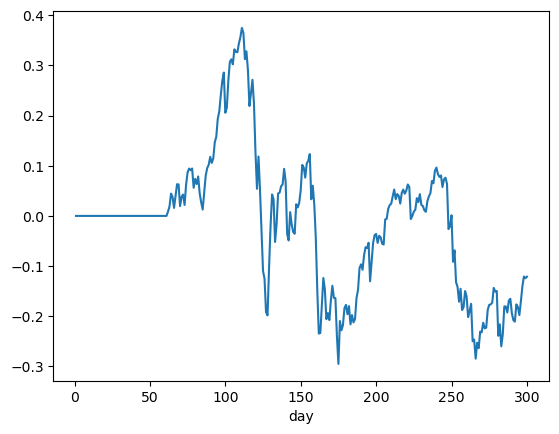

In [26]:
# indicator of going up
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
np.log(simple_return + 1).cumsum().plot(x='day')

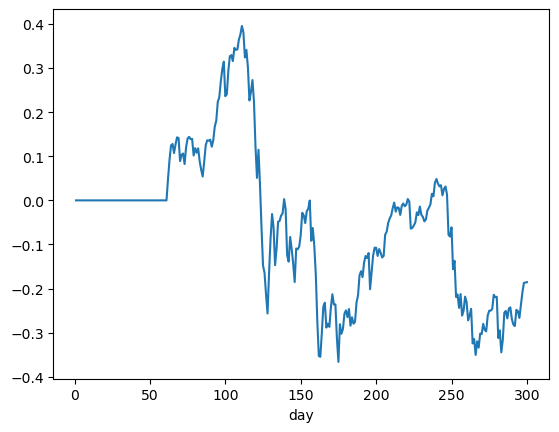

In [29]:
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
np.log(simple_return + 1).cumsum().plot(x='day')

In [8]:
class MAPortfolio:
    def __init__(self):
        pass

    def initialize(self, X, y):
        pass

    def train(self, X, y):
        pass

    def construct(self, X):
        current_day = X.day.max().item()
        X_ = X.sel(day=[current_day])
        ma_5 = X_.close_moving_5_ratio
        ma_20 = X_.close_moving_20_ratio
        y_sgn_1 = 10 > (ma_20 / ma_5)
        y_sgn_2 = (ma_20 / ma_5) > 1.02
        y_sgn = y_sgn_1 & y_sgn_2
        s = y_sgn.sum(dim='asset').item()
        # print(y_sgn)
        # if s < 1e-6:
        #    return y_sgn
        # return y_sgn / s
        return y_sgn / 54

In [9]:
ma_portfolio = MAPortfolio()
stat = bt.cross_validation(ma_portfolio, features, ds, lookback_window=10, need_full_lookback=True)

  0%|          | 0/1700 [00:00<?, ?it/s]

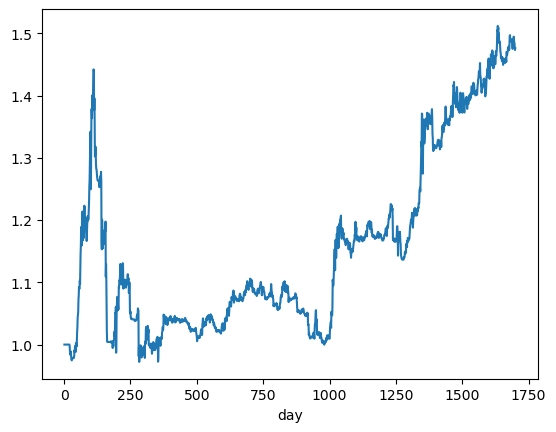

In [13]:
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
(np.exp(np.log(simple_return + 1).cumsum())).plot(x='day')

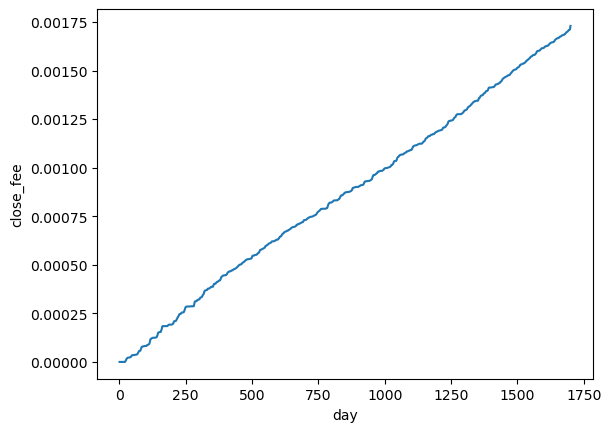

In [19]:
stat.close_fee.mean(dim='asset').cumsum(dim='day').plot(x='day')

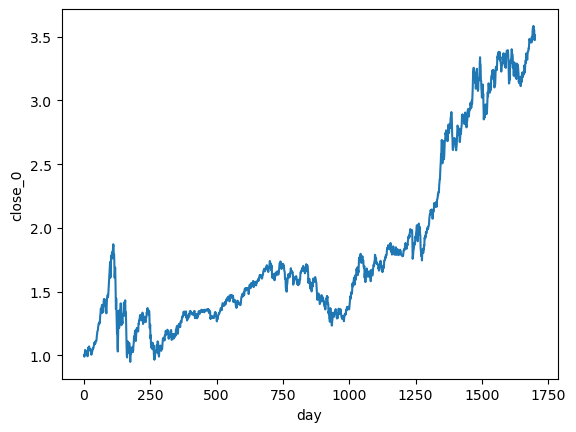

In [16]:
(ds['close_0'] / ds['close_0'].isel(day=0)).mean(dim='asset').plot(x='day')

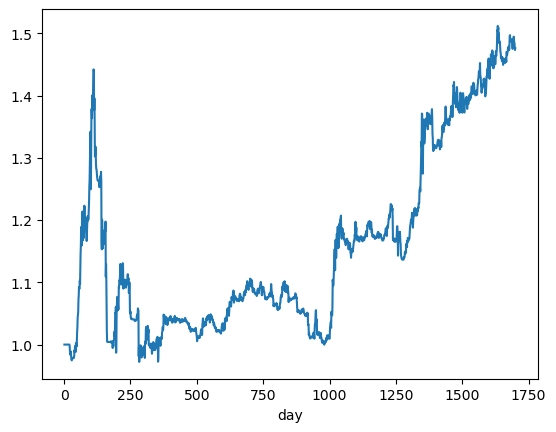

In [15]:
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
(np.exp(np.log(simple_return + 1).cumsum())).plot(x='day')

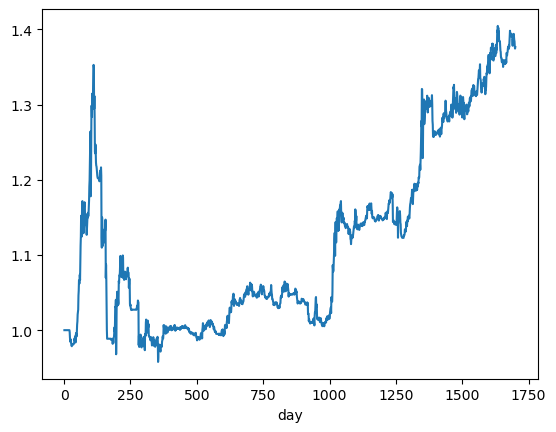

In [59]:
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
np.exp(np.log(simple_return + 1).cumsum()).plot(x='day')

In [43]:
class PEPortfolio:
    def __init__(self):
        pass

    def initialize(self, X, y):
        pass

    def train(self, X, y):
        pass

    def construct(self, X):
        current_day = X.day.max().item()
        X_ = X.sel(day=[current_day])
        pe = X_.pe
        good_company = (pe > 0) & (pe < 10)
        market_pe = pe.median().item()
        investment = np.where(good_company, 1 / pe, 0)
        s = max(1e-6, investment.sum())
        y = investment / s
        return y * min(40 / market_pe, 1)


In [44]:
pe_portfolio = PEPortfolio()
stat = bt.cross_validation(pe_portfolio, ['pe'], ds, lookback_window=3, need_full_lookback=True)

  0%|          | 0/1700 [00:00<?, ?it/s]

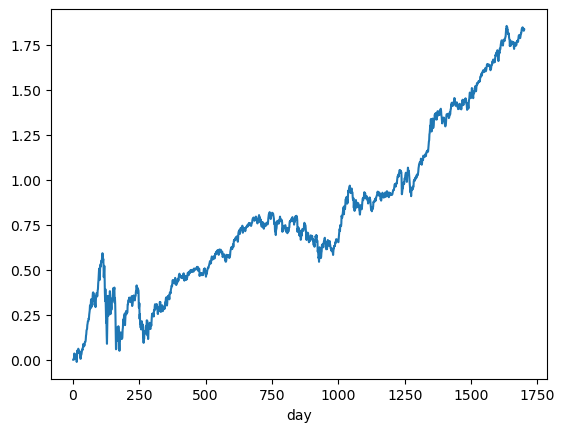

In [24]:
# PE>0
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
(np.log(simple_return + 1).cumsum()).plot(x='day')


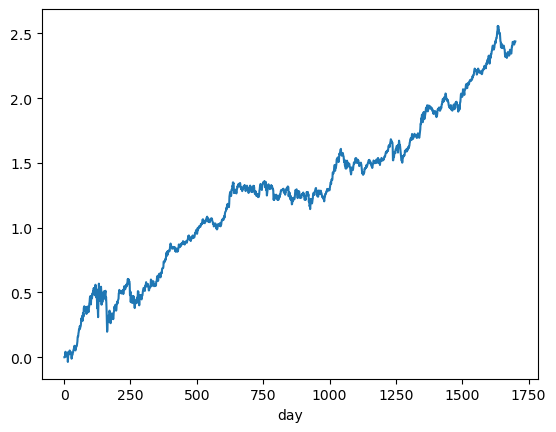

In [37]:
# 20>PE>0, market_pe|50
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
(np.log(simple_return + 1).cumsum()).plot(x='day')



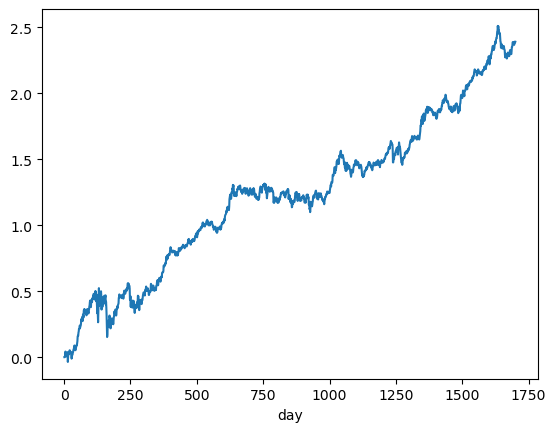

In [40]:
# 20>PE>0, market_pe|40
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
(np.log(simple_return + 1).cumsum()).plot(x='day')


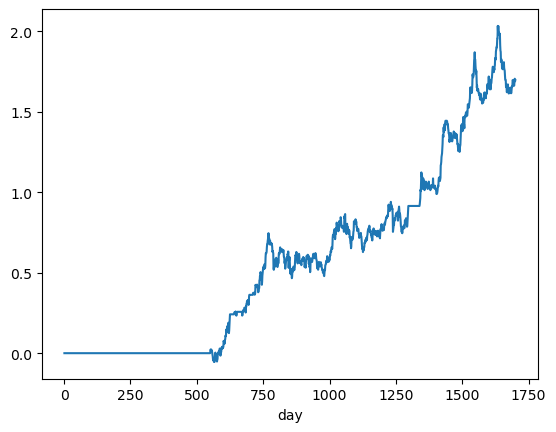

In [45]:
# 10>PE>0, market_pe|40
simple_return = (stat.holding_return - stat.open_fee.shift(day=1) - stat.close_fee).fillna(0).sum(dim='asset')
(np.log(simple_return + 1).cumsum()).plot(x='day')